# Pre-viewing face > object GLM using explicit h/o labels

This notebook validates the fMRI GLM pipeline using a simple face/object contrast inspired by Kanwisher et al. (1997).

The stimulus filenames contain an explicit `h` or `o` token for old items:

- `h` = human / face image
- `o` = object image

New images are modeled as `other` and assigned zero weight in the `face > object` contrast.

Main contrast:

$$
\text{faces} > \text{objects} = \beta_{\text{face}} - \beta_{\text{object}}
$$

The expected result is activation in ventral occipito-temporal cortex, especially fusiform face area (FFA)-like regions.

In [ ]:
from pathlib import Path
import warnings

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

import nibabel as nib
from nilearn import image, plotting, datasets
from nilearn.glm.first_level import FirstLevelModel
from nilearn.glm.second_level import SecondLevelModel
from nilearn.reporting import get_clusters_table
from nilearn.maskers import NiftiMasker

from scipy.stats import ttest_1samp, wilcoxon

warnings.filterwarnings("ignore", category=FutureWarning)

pd.set_option("display.max_columns", 100)
pd.set_option("display.max_rows", 80)

In [2]:
# --------------------------------------------------
# Project paths and analysis settings
# --------------------------------------------------

PROJECT_ROOT = Path("/media/RCPNAS/Data3/Alison_island/kroczak/island_semester_project")

BIDS_DIR = PROJECT_ROOT / "data" / "bids_ackbar"
FMRIPREP_DIR = PROJECT_ROOT / "data" / "fmriprep_output"

PRE_SES = "ses-01"
TASK = "viewing"

OUT_DIR = PROJECT_ROOT / "data" / "processed" / "glm" / "pre_viewing_old_ho_faces_objects"
EVENTS_OUT_DIR = PROJECT_ROOT / "data" / "preprocessed" / "relabeled_events_pre_viewing_old_ho_faces_objects"

OUT_DIR.mkdir(parents=True, exist_ok=True)
EVENTS_OUT_DIR.mkdir(parents=True, exist_ok=True)

SMOOTH_FWHM = 5.0
HRF_MODEL = "spm + derivative + dispersion"

path_summary = pd.DataFrame([{
    "BIDS exists": BIDS_DIR.exists(),
    "fMRIPrep exists": FMRIPREP_DIR.exists(),
    "output_dir": str(OUT_DIR),
    "events_output_dir": str(EVENTS_OUT_DIR),
    "smoothing_fwhm": SMOOTH_FWHM,
    "hrf_model": HRF_MODEL,
}])

display(path_summary)

,BIDS exists,fMRIPrep exists,output_dir,events_output_dir,smoothing_fwhm,hrf_model
0,True,True,/media/RCPNAS/Data3/Alison_island/kroczak/isla...,/media/RCPNAS/Data3/Alison_island/kroczak/isla...,5.0,spm + derivative + dispersion


## 1. Locate files

For each subject, we check whether the pre-viewing events file, preprocessed BOLD image, and fMRIPrep confounds are available.

In [3]:
# --------------------------------------------------
# Locate BIDS events, fMRIPrep BOLD files, and confounds
# --------------------------------------------------

subjects = sorted([p.name for p in BIDS_DIR.glob("sub-*") if p.is_dir()])

file_rows = []

for sub in subjects:
    event_candidates = sorted(
        BIDS_DIR.glob(f"{sub}/{PRE_SES}/func/{sub}_{PRE_SES}_task-{TASK}*_events.tsv")
    )
    
    bold_candidates = sorted(
        FMRIPREP_DIR.glob(
            f"{sub}/{PRE_SES}/func/*task-{TASK}*space-MNI152NLin2009cAsym*desc-preproc_bold.nii.gz"
        )
    )
    
    confound_candidates = sorted(
        FMRIPREP_DIR.glob(
            f"{sub}/{PRE_SES}/func/*task-{TASK}*desc-confounds_timeseries.tsv"
        )
    )
    
    file_rows.append({
        "sub": sub,
        "has_events": len(event_candidates) > 0,
        "has_bold": len(bold_candidates) > 0,
        "has_confounds": len(confound_candidates) > 0,
        "events_path": event_candidates[0] if event_candidates else None,
        "bold_path": bold_candidates[0] if bold_candidates else None,
        "confounds_path": confound_candidates[0] if confound_candidates else None,
    })

files_df = pd.DataFrame(file_rows)

usable_subjects = files_df.query(
    "has_events and has_bold and has_confounds"
)["sub"].tolist()

file_summary = pd.DataFrame([{
    "n_subjects_found": len(subjects),
    "n_subjects_usable": len(usable_subjects),
}])

display(file_summary)
display(files_df[["sub", "has_events", "has_bold", "has_confounds"]])

,n_subjects_found,n_subjects_usable
0,32,32


,sub,has_events,has_bold,has_confounds
0,sub-P10,True,True,True
1,sub-P12,True,True,True
2,sub-P13,True,True,True
3,sub-P14,True,True,True
4,sub-P15,True,True,True
5,sub-P16,True,True,True
6,sub-P17,True,True,True
7,sub-P18,True,True,True
8,sub-P19,True,True,True
9,sub-P20,True,True,True


## 2. Inspect one events file

The event file contains the image filename, timing information, button response, answer, and reaction time.

In [4]:
# --------------------------------------------------
# Inspect one example events file
# --------------------------------------------------

example_sub = "sub-P10"
example_events_path = files_df.set_index("sub").loc[example_sub, "events_path"]

raw_events = pd.read_csv(example_events_path, sep="\t")

print("Example subject:", example_sub)
print("Events shape:", raw_events.shape)

display(raw_events.head(12))

Example subject: sub-P10
Events shape: (384, 7)


,onset,duration,event,button_pressed,answer,HumanAppearOnThe,reaction_time
0,4.634,3.017,maya_3_e3_6_r_h_v1_old.jpg,1,2.0,Right,1.822
1,11.701,3.017,wealth_5_e3_7_nr_o_v1_old.jpg,1,1.0,Right,0.582
2,17.934,3.017,pirate_6_e2_13_r_h_v1_old.jpg,1,2.0,Right,0.561
3,24.534,3.017,viking_11_new.jpg,1,2.0,Right,0.469
4,30.451,3.016,pirate_7_e3_1_nr_h_v1_old.jpg,1,2.0,Right,0.448
5,37.151,3.016,food_8_e3_13_r_o_v1_old.jpg,1,1.0,Right,0.366
6,43.367,3.017,pirate_8_e2_6_r_h_v1_old.jpg,1,2.0,Right,0.335
7,48.551,3.016,food_9_new.jpg,1,1.0,Right,0.768
8,54.367,3.017,viking_3_e2_1_nr_h_v1_old.jpg,1,2.0,Right,1.589
9,61.800,3.017,food_6_e2_2_nr_o_v1_old.jpg,1,1.0,Right,0.377


## 3. Parse old h/o face/object labels

Old images contain an explicit stimulus-type token:

Example:

- `maya_3_e3_6_r_h_v1_old.jpg` → `h` → face
- `wealth_5_e3_7_nr_o_v1_old.jpg` → `o` → object

New images do not contain this explicit `h/o` token, so they are modeled as `other`.

The GLM will therefore have three regressors:

- `face`
- `object`
- `other`

The contrast `face > object` uses weights:

\[
[1, -1, 0]
\]

so `other` is modeled but does not contribute to the contrast.

In [5]:
# --------------------------------------------------
# Parse explicit h/o labels from old filenames
# --------------------------------------------------

def classify_old_ho_trial(filename):
    """
    Classify trials based on the explicit h/o token in old filenames.
    
    Examples:
        maya_3_e3_6_r_h_v1_old.jpg       -> face
        wealth_5_e3_7_nr_o_v1_old.jpg    -> object
        viking_11_new.jpg                -> other
    """
    if pd.isna(filename):
        return "other"
    
    s = str(filename).lower()
    s = (
        s.replace(".jpg", "")
         .replace(".jpeg", "")
         .replace(".png", "")
    )
    
    parts = s.split("_")
    
    if len(parts) >= 8 and parts[-1] == "old":
        stim_type = parts[5]
        
        if stim_type == "h":
            return "face"
        elif stim_type == "o":
            return "object"
    
    return "other"


def make_old_ho_events(events):
    """
    Create a clean events table for the GLM:
    onset, duration, image, trial_type.
    """
    clean = events[["onset", "duration", "event"]].copy()
    clean = clean.rename(columns={"event": "image"})
    
    clean["trial_type"] = clean["image"].apply(classify_old_ho_trial)
    
    clean["onset"] = pd.to_numeric(clean["onset"], errors="coerce")
    clean["duration"] = pd.to_numeric(clean["duration"], errors="coerce")
    
    clean = clean.dropna(subset=["onset", "duration", "trial_type"]).copy()
    
    return clean


example_clean_events = make_old_ho_events(raw_events)

display(example_clean_events.head(15))
display(example_clean_events["trial_type"].value_counts().to_frame("n_events"))

,onset,duration,image,trial_type
0,4.634,3.017,maya_3_e3_6_r_h_v1_old.jpg,face
1,11.701,3.017,wealth_5_e3_7_nr_o_v1_old.jpg,object
2,17.934,3.017,pirate_6_e2_13_r_h_v1_old.jpg,face
3,24.534,3.017,viking_11_new.jpg,other
4,30.451,3.016,pirate_7_e3_1_nr_h_v1_old.jpg,face
5,37.151,3.016,food_8_e3_13_r_o_v1_old.jpg,object
6,43.367,3.017,pirate_8_e2_6_r_h_v1_old.jpg,face
7,48.551,3.016,food_9_new.jpg,other
8,54.367,3.017,viking_3_e2_1_nr_h_v1_old.jpg,face
9,61.800,3.017,food_6_e2_2_nr_o_v1_old.jpg,object


,n_events
trial_type,
face,144
object,144
other,96


In [6]:
# --------------------------------------------------
# Create clean old h/o event files for all subjects
# --------------------------------------------------

event_summary_rows = []

for sub in usable_subjects:
    events_path = files_df.set_index("sub").loc[sub, "events_path"]
    events = pd.read_csv(events_path, sep="\t")
    
    clean_events = make_old_ho_events(events)
    
    out_path = EVENTS_OUT_DIR / f"{sub}_{PRE_SES}_task-{TASK}_events_old_ho_faces_objects.tsv"
    clean_events.to_csv(out_path, sep="\t", index=False)
    
    counts = clean_events["trial_type"].value_counts().to_dict()
    
    event_summary_rows.append({
        "sub": sub,
        "n_trials": len(clean_events),
        "n_face": counts.get("face", 0),
        "n_object": counts.get("object", 0),
        "n_other": counts.get("other", 0),
    })

event_summary_df = pd.DataFrame(event_summary_rows)

valid_glm_subjects = event_summary_df.query(
    "n_face > 0 and n_object > 0"
)["sub"].tolist()

display(event_summary_df)

print("Valid GLM subjects:", len(valid_glm_subjects))

,sub,n_trials,n_face,n_object,n_other
0,sub-P10,384,144,144,96
1,sub-P12,384,144,144,96
2,sub-P13,384,144,144,96
3,sub-P14,384,144,144,96
4,sub-P15,384,144,144,96
5,sub-P16,384,144,144,96
6,sub-P17,384,144,144,96
7,sub-P18,384,144,144,96
8,sub-P19,384,144,144,96
9,sub-P20,384,144,144,96


Valid GLM subjects: 32


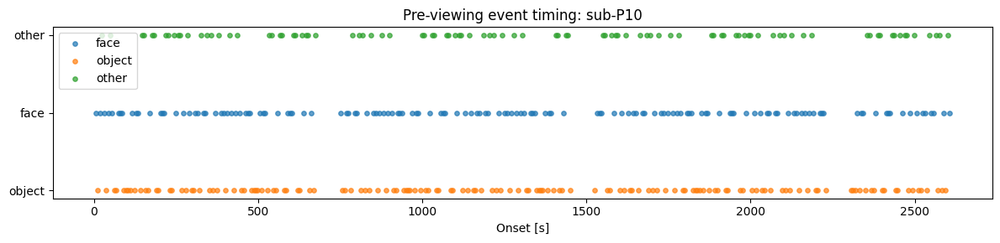

In [7]:
# --------------------------------------------------
# Visualize timing of face, object, and other events
# --------------------------------------------------

plot_sub = "sub-P10"

plot_events_path = (
    EVENTS_OUT_DIR
    / f"{plot_sub}_{PRE_SES}_task-{TASK}_events_old_ho_faces_objects.tsv"
)

plot_events = pd.read_csv(plot_events_path, sep="\t")

plt.figure(figsize=(12, 3))

y_map = {
    "object": 0,
    "face": 1,
    "other": 2,
}

for trial_type, df in plot_events.groupby("trial_type"):
    plt.scatter(
        df["onset"],
        np.repeat(y_map[trial_type], len(df)),
        label=trial_type,
        alpha=0.7,
        s=15,
    )

plt.yticks([0, 1, 2], ["object", "face", "other"])
plt.xlabel("Onset [s]")
plt.title(f"Pre-viewing event timing: {plot_sub}")
plt.legend()
plt.tight_layout()
plt.show()

## 4. Behavioral QC

This checks whether participants responded during the pre-viewing run. It is not a direct proof that participants were awake, but missing responses or abnormal reaction-time profiles would indicate potential disengagement.

In [8]:
# --------------------------------------------------
# Behavioral QC: response completeness and reaction times
# --------------------------------------------------

def summarize_behavioral_engagement(sub):
    events_path = files_df.set_index("sub").loc[sub, "events_path"]
    events = pd.read_csv(events_path, sep="\t")
    
    rt = pd.to_numeric(events["reaction_time"], errors="coerce")
    
    return {
        "sub": sub,
        "n_trials": len(events),
        "button_missing_rate": events["button_pressed"].isna().mean(),
        "answer_missing_rate": events["answer"].isna().mean(),
        "rt_missing_rate": rt.isna().mean(),
        "rt_median": rt.median(),
        "rt_std": rt.std(),
        "rt_lt_0p2_rate": (rt < 0.2).mean(),
        "rt_ge_2s_rate": (rt >= 2.0).mean(),
    }


behavior_qc_df = pd.DataFrame([
    summarize_behavioral_engagement(sub)
    for sub in valid_glm_subjects
])

behavior_qc_df["flag_fast_rt"] = behavior_qc_df["rt_lt_0p2_rate"] > 0.10
behavior_qc_df["flag_slow_rt"] = behavior_qc_df["rt_median"] > 1.0
behavior_qc_df["flag_low_rt_variability"] = behavior_qc_df["rt_std"] < 0.10
behavior_qc_df["flag_missing_responses"] = (
    (behavior_qc_df["button_missing_rate"] > 0)
    | (behavior_qc_df["answer_missing_rate"] > 0)
    | (behavior_qc_df["rt_missing_rate"] > 0)
)

behavior_qc_df["n_behavior_flags"] = behavior_qc_df[[
    "flag_fast_rt",
    "flag_slow_rt",
    "flag_low_rt_variability",
    "flag_missing_responses",
]].sum(axis=1)

behavior_qc_summary = behavior_qc_df[[
    "sub",
    "n_trials",
    "button_missing_rate",
    "answer_missing_rate",
    "rt_missing_rate",
    "rt_median",
    "rt_std",
    "rt_lt_0p2_rate",
    "rt_ge_2s_rate",
    "n_behavior_flags",
]].sort_values("n_behavior_flags", ascending=False)

display(behavior_qc_summary)

behavior_qc_summary.to_csv(
    OUT_DIR / "pre_viewing_behavioral_qc_summary.csv",
    index=False,
)

,sub,n_trials,button_missing_rate,answer_missing_rate,rt_missing_rate,rt_median,rt_std,rt_lt_0p2_rate,rt_ge_2s_rate,n_behavior_flags
16,sub-P30,384,0.0,0.0,0.0,0.2340,0.083077,0.164062,0.000000,2
6,sub-P17,384,0.0,0.0,0.0,0.2380,0.296228,0.304688,0.018229,1
29,sub-P49,384,0.0,0.0,0.0,1.2315,0.773172,0.049479,0.416667,1
14,sub-P26,384,0.0,0.0,0.0,0.3070,0.275759,0.114583,0.007812,1
27,sub-P47,384,0.0,0.0,0.0,0.1840,0.209809,0.533854,0.002604,1
21,sub-P37,384,0.0,0.0,0.0,0.5245,0.770974,0.223958,0.247396,1
18,sub-P34,384,0.0,0.0,0.0,0.2485,0.133077,0.164062,0.000000,1
28,sub-P48,384,0.0,0.0,0.0,0.2470,0.241482,0.296875,0.002604,1
7,sub-P18,384,0.0,0.0,0.0,0.4695,0.293138,0.002604,0.015625,0
8,sub-P19,384,0.0,0.0,0.0,0.3700,0.185236,0.028646,0.002604,0


/tmp/ipykernel_2314979/3587773851.py:25: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  plt.boxplot(data, labels=valid_glm_subjects, showfliers=False)


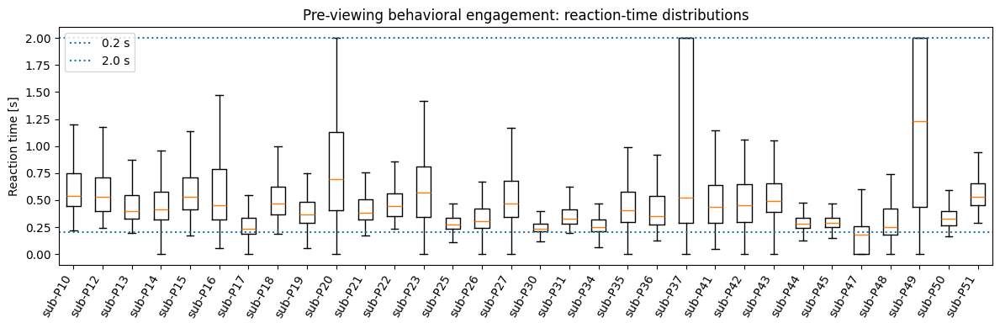

In [9]:
# --------------------------------------------------
# Reaction-time distribution across subjects
# --------------------------------------------------

rt_rows = []

for sub in valid_glm_subjects:
    events_path = files_df.set_index("sub").loc[sub, "events_path"]
    events = pd.read_csv(events_path, sep="\t")
    
    rt_rows.append(pd.DataFrame({
        "sub": sub,
        "reaction_time": pd.to_numeric(events["reaction_time"], errors="coerce"),
    }))

rt_long_df = pd.concat(rt_rows, ignore_index=True)

plt.figure(figsize=(12, 4))

data = [
    rt_long_df.query("sub == @sub")["reaction_time"].dropna().values
    for sub in valid_glm_subjects
]

plt.boxplot(data, labels=valid_glm_subjects, showfliers=False)
plt.axhline(0.2, linestyle=":", label="0.2 s")
plt.axhline(2.0, linestyle=":", label="2.0 s")
plt.xticks(rotation=60, ha="right")
plt.ylabel("Reaction time [s]")
plt.title("Pre-viewing behavioral engagement: reaction-time distributions")
plt.legend()
plt.tight_layout()
plt.show()

## 5. Motion QC

We summarize framewise displacement and DVARS from fMRIPrep confounds. Subjects with elevated motion are flagged for manual inspection, but not automatically excluded.

In [10]:
# --------------------------------------------------
# Motion and signal QC from fMRIPrep confounds
# --------------------------------------------------

def summarize_motion_qc(sub):
    conf_path = files_df.set_index("sub").loc[sub, "confounds_path"]
    confounds = pd.read_csv(conf_path, sep="\t")
    
    row = {"sub": sub, "n_scans": len(confounds)}
    
    if "framewise_displacement" in confounds.columns:
        fd = pd.to_numeric(confounds["framewise_displacement"], errors="coerce").fillna(0)
        row["mean_fd"] = fd.mean()
        row["max_fd"] = fd.max()
        row["fd_gt_0p5_rate"] = (fd > 0.5).mean()
        row["fd_gt_1p0_rate"] = (fd > 1.0).mean()
    
    if "std_dvars" in confounds.columns:
        dvars = pd.to_numeric(confounds["std_dvars"], errors="coerce")
        row["mean_std_dvars"] = dvars.mean()
        row["max_std_dvars"] = dvars.max()
    
    if "global_signal" in confounds.columns:
        gs = pd.to_numeric(confounds["global_signal"], errors="coerce")
        row["global_signal_std"] = gs.std()
    
    return row


motion_qc_df = pd.DataFrame([
    summarize_motion_qc(sub)
    for sub in valid_glm_subjects
])

motion_qc_df["flag_high_mean_fd"] = motion_qc_df["mean_fd"] > 0.30
motion_qc_df["flag_many_fd_spikes"] = motion_qc_df["fd_gt_0p5_rate"] > 0.20

motion_qc_summary = motion_qc_df[[
    "sub",
    "n_scans",
    "mean_fd",
    "max_fd",
    "fd_gt_0p5_rate",
    "fd_gt_1p0_rate",
    "mean_std_dvars",
    "max_std_dvars",
    "global_signal_std",
    "flag_high_mean_fd",
    "flag_many_fd_spikes",
]].sort_values("mean_fd", ascending=False)

display(motion_qc_summary)

motion_qc_summary.to_csv(
    OUT_DIR / "pre_viewing_motion_qc_summary.csv",
    index=False,
)

,sub,n_scans,mean_fd,max_fd,fd_gt_0p5_rate,fd_gt_1p0_rate,mean_std_dvars,max_std_dvars,global_signal_std,flag_high_mean_fd,flag_many_fd_spikes
8,sub-P19,1939,0.447721,25.806862,0.172769,0.073749,1.077512,6.267375,5.825039,True,False
10,sub-P21,1956,0.333007,3.387354,0.197853,0.080266,1.020260,3.347733,4.582512,True,False
2,sub-P13,1952,0.286397,4.906855,0.109631,0.021004,1.085487,4.098773,4.569820,False,False
9,sub-P20,2146,0.209767,6.077464,0.066636,0.034017,1.075969,3.850160,4.754155,False,False
23,sub-P42,1756,0.208838,2.579877,0.033599,0.007403,1.181164,2.706800,5.234322,False,False
3,sub-P14,1967,0.208590,23.955056,0.034062,0.019827,1.041554,8.705614,6.688702,False,False
7,sub-P18,1979,0.188459,6.574660,0.055078,0.025771,1.116092,5.586657,4.847432,False,False
19,sub-P35,1758,0.185967,1.949903,0.027873,0.005119,1.119834,1.830520,4.065531,False,False
11,sub-P22,1977,0.151675,2.187309,0.039960,0.007587,1.140095,3.384648,3.147584,False,False
29,sub-P49,1940,0.143075,0.658375,0.002577,0.000000,1.177823,1.710401,5.512562,False,False


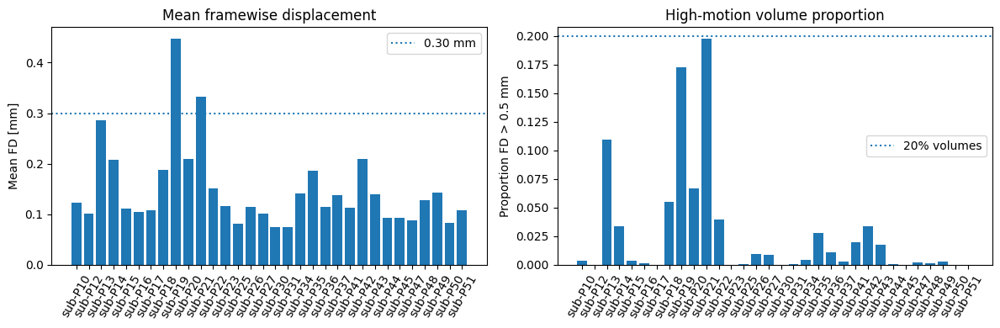

In [11]:
# --------------------------------------------------
# Motion QC plots
# --------------------------------------------------

fig, axes = plt.subplots(1, 2, figsize=(12, 4))

axes[0].bar(motion_qc_df["sub"], motion_qc_df["mean_fd"])
axes[0].axhline(0.30, linestyle=":", label="0.30 mm")
axes[0].set_title("Mean framewise displacement")
axes[0].set_ylabel("Mean FD [mm]")
axes[0].tick_params(axis="x", rotation=60)
axes[0].legend()

axes[1].bar(motion_qc_df["sub"], motion_qc_df["fd_gt_0p5_rate"])
axes[1].axhline(0.20, linestyle=":", label="20% volumes")
axes[1].set_title("High-motion volume proportion")
axes[1].set_ylabel("Proportion FD > 0.5 mm")
axes[1].tick_params(axis="x", rotation=60)
axes[1].legend()

plt.tight_layout()
plt.show()

In [12]:
# --------------------------------------------------
# Combined behavioral + motion QC summary
# --------------------------------------------------

combined_qc_df = behavior_qc_df[[
    "sub",
    "n_behavior_flags",
    "flag_fast_rt",
    "flag_slow_rt",
    "flag_low_rt_variability",
    "flag_missing_responses",
]].merge(
    motion_qc_df[[
        "sub",
        "mean_fd",
        "fd_gt_0p5_rate",
        "flag_high_mean_fd",
        "flag_many_fd_spikes",
    ]],
    on="sub",
    how="left",
)

combined_qc_df["n_motion_flags"] = combined_qc_df[[
    "flag_high_mean_fd",
    "flag_many_fd_spikes",
]].sum(axis=1)

combined_qc_df["n_total_flags"] = (
    combined_qc_df["n_behavior_flags"]
    + combined_qc_df["n_motion_flags"]
)

combined_qc_df["qc_note"] = "OK"
combined_qc_df.loc[
    combined_qc_df["n_total_flags"] > 0,
    "qc_note"
] = "Inspect manually"

combined_qc_summary = combined_qc_df.sort_values(
    "n_total_flags",
    ascending=False,
)

display(combined_qc_summary)

combined_qc_summary.to_csv(
    OUT_DIR / "pre_viewing_combined_qc_summary.csv",
    index=False,
)

,sub,n_behavior_flags,flag_fast_rt,flag_slow_rt,flag_low_rt_variability,flag_missing_responses,mean_fd,fd_gt_0p5_rate,flag_high_mean_fd,flag_many_fd_spikes,n_motion_flags,n_total_flags,qc_note
16,sub-P30,2,True,False,True,False,0.074860,0.000000,False,False,0,2,Inspect manually
6,sub-P17,1,True,False,False,False,0.107940,0.000000,False,False,0,1,Inspect manually
10,sub-P21,0,False,False,False,False,0.333007,0.197853,True,False,1,1,Inspect manually
14,sub-P26,1,True,False,False,False,0.114625,0.009860,False,False,0,1,Inspect manually
27,sub-P47,1,True,False,False,False,0.088614,0.002457,False,False,0,1,Inspect manually
21,sub-P37,1,True,False,False,False,0.137730,0.003273,False,False,0,1,Inspect manually
18,sub-P34,1,True,False,False,False,0.140832,0.004212,False,False,0,1,Inspect manually
8,sub-P19,0,False,False,False,False,0.447721,0.172769,True,False,1,1,Inspect manually
29,sub-P49,1,False,True,False,False,0.143075,0.002577,False,False,0,1,Inspect manually
28,sub-P48,1,True,False,False,False,0.128441,0.001183,False,False,0,1,Inspect manually


In [13]:
# --------------------------------------------------
# Define main and sensitivity subject sets
# --------------------------------------------------

main_subjects = valid_glm_subjects.copy()

# Conservative sensitivity set:
# remove subjects with elevated mean FD
motion_exclude_subjects = combined_qc_summary.query(
    "flag_high_mean_fd"
)["sub"].tolist()

sensitivity_subjects_motion = [
    sub for sub in valid_glm_subjects
    if sub not in motion_exclude_subjects
]

subject_set_summary = pd.DataFrame([
    {
        "analysis": "main_all_subjects",
        "n_subjects": len(main_subjects),
        "excluded_subjects": "",
    },
    {
        "analysis": "sensitivity_exclude_high_motion",
        "n_subjects": len(sensitivity_subjects_motion),
        "excluded_subjects": ", ".join(motion_exclude_subjects),
    },
])

display(subject_set_summary)

print("Main subjects:", len(main_subjects))
print("Sensitivity subjects:", len(sensitivity_subjects_motion))
print("Excluded for high motion:", motion_exclude_subjects)

,analysis,n_subjects,excluded_subjects
0,main_all_subjects,32,
1,sensitivity_exclude_high_motion,30,"sub-P21, sub-P19"


Main subjects: 32
Sensitivity subjects: 30
Excluded for high motion: ['sub-P21', 'sub-P19']


### QC interpretation

All participants had complete behavioral logs, with no missing button presses, answers, or reaction times. Therefore, there was no direct behavioral evidence of sleep or complete disengagement during the pre-viewing run.

Motion QC showed generally acceptable motion for most participants. Two subjects had elevated mean framewise displacement: `sub-P19` and `sub-P21`, both above the 0.30 mm mean FD threshold. `sub-P21` was also close to the high-motion volume threshold, with approximately 19.8% of volumes above 0.5 mm FD.

Several participants showed atypical reaction-time profiles, mainly many very fast responses or slower median responses. These were flagged for manual inspection but not treated as automatic exclusion criteria.

The main GLM is therefore run on all 32 subjects. As a sensitivity check, the group-level analysis can be repeated after excluding the strongest QC concerns, especially `sub-P19` and `sub-P21`.

## 6. Conceptual model

At each voxel, the first-level GLM estimates the BOLD response associated with each condition.

The model is:

$$
Y(t)
=
\beta_{\text{face}} X_{\text{face}}(t)
+
\beta_{\text{object}} X_{\text{object}}(t)
+
\beta_{\text{other}} X_{\text{other}}(t)
+
\beta_{\text{confounds}} X_{\text{confounds}}(t)
+
\epsilon(t)
$$

where:

- $Y(t)$ is the measured BOLD signal over time.
- $X_{\text{face}}(t)$ is the predicted BOLD response to face trials.
- $X_{\text{object}}(t)$ is the predicted BOLD response to object trials.
- $X_{\text{other}}(t)$ is the predicted BOLD response to new/other trials.
- $X_{\text{confounds}}(t)$ includes motion and nuisance regressors.
- $\epsilon(t)$ is residual noise.

The contrast of interest is:

$$
\text{face} > \text{object}
=
\beta_{\text{face}} - \beta_{\text{object}}
$$

Red voxels in the `face > object` map indicate voxels where the GLM-estimated BOLD response is larger for face images than object images.

Blue voxels indicate the opposite, meaning the GLM-estimated response is larger for object images than face images.

## 7. HRF model choice

The neural response to an image is not observed directly in fMRI. Instead, fMRI measures a delayed and smoothed blood-oxygen-level-dependent (BOLD) response. Therefore, each event regressor is convolved with a hemodynamic response function (HRF).

Here we use:

`hrf_model = "spm + derivative + dispersion"`

Conceptually:

- `spm` means the canonical SPM HRF, a standard expected shape of the BOLD response.
- `derivative` adds a temporal derivative, allowing the response peak to shift slightly earlier or later.
- `dispersion` adds a dispersion derivative, allowing the response to be slightly narrower or wider.

The main contrast still tests the canonical face response minus the canonical object response. The derivative and dispersion regressors help absorb small timing/shape differences in the BOLD response, making the model more flexible.

For a simple localizer, `hrf_model = "spm"` is also reasonable. It assumes the same canonical HRF shape everywhere. The derivative/dispersion model is more flexible and can handle modest subject- or voxel-level HRF variability.

In [14]:
# --------------------------------------------------
# First-level GLM: old h/o faces vs objects
# --------------------------------------------------

def run_subject_old_ho_glm(
    sub,
    smooth_fwhm=SMOOTH_FWHM,
    hrf_model=HRF_MODEL,
):
    events_path = EVENTS_OUT_DIR / f"{sub}_{PRE_SES}_task-{TASK}_events_old_ho_faces_objects.tsv"
    bold_path = files_df.set_index("sub").loc[sub, "bold_path"]
    confounds_path = files_df.set_index("sub").loc[sub, "confounds_path"]
    
    bold_img = nib.load(str(bold_path))
    events = pd.read_csv(events_path, sep="\t")
    confounds = pd.read_csv(confounds_path, sep="\t")
    
    glm_events = events[["onset", "duration", "trial_type"]].copy()
    
    # Basic nuisance regressors from fMRIPrep
    confound_cols = [
        "trans_x", "trans_y", "trans_z",
        "rot_x", "rot_y", "rot_z",
        "framewise_displacement",
        "global_signal",
        "csf",
        "white_matter",
    ]
    
    available_confound_cols = [
        c for c in confound_cols
        if c in confounds.columns
    ]
    
    selected_confounds = confounds[available_confound_cols].copy()
    selected_confounds = selected_confounds.replace([np.inf, -np.inf], np.nan)
    selected_confounds = selected_confounds.fillna(0)
    
    # Gray-matter mask in BOLD space
    gm_mask = datasets.load_mni152_gm_mask(threshold=0.2)
    gm_mask_resampled = image.resample_to_img(
        gm_mask,
        bold_img,
        interpolation="nearest",
        force_resample=True,
        copy_header=True,
    )
    
    fmri_glm = FirstLevelModel(
        t_r=1.0,
        slice_time_ref=0.5,
        hrf_model=hrf_model,
        drift_model="cosine",
        high_pass=0.01,
        mask_img=gm_mask_resampled,
        smoothing_fwhm=smooth_fwhm,
        standardize=False,
        signal_scaling=0,
        noise_model="ar1",
        minimize_memory=False,
        n_jobs=-1,
    )
    
    fmri_glm = fmri_glm.fit(
        run_imgs=bold_img,
        events=glm_events,
        confounds=selected_confounds,
    )
    
    design_matrix = fmri_glm.design_matrices_[0]
    
    def make_contrast(weights):
        contrast_vec = np.zeros(len(design_matrix.columns))
        
        for name, weight in weights.items():
            if name not in design_matrix.columns:
                raise ValueError(f"Regressor '{name}' not found for {sub}.")
            contrast_vec[design_matrix.columns.get_loc(name)] = weight
        
        return contrast_vec
    
    contrast_specs = {
        "faces_gt_objects": {"face": 1.0, "object": -1.0},
        "objects_gt_faces": {"object": 1.0, "face": -1.0},
    }
    
    z_maps = {}
    effect_maps = {}
    
    for contrast_name, weights in contrast_specs.items():
        contrast_vec = make_contrast(weights)
        
        z_maps[contrast_name] = fmri_glm.compute_contrast(
            contrast_vec,
            output_type="z_score",
        )
        
        effect_maps[contrast_name] = fmri_glm.compute_contrast(
            contrast_vec,
            output_type="effect_size",
        )
    
    return {
        "sub": sub,
        "glm": fmri_glm,
        "design_matrix": design_matrix,
        "z_maps": z_maps,
        "effect_maps": effect_maps,
        "events": events,
    }

/tmp/ipykernel_2314979/2812857322.py:10: UserWarning: The figure layout has changed to tight
  plt.tight_layout()


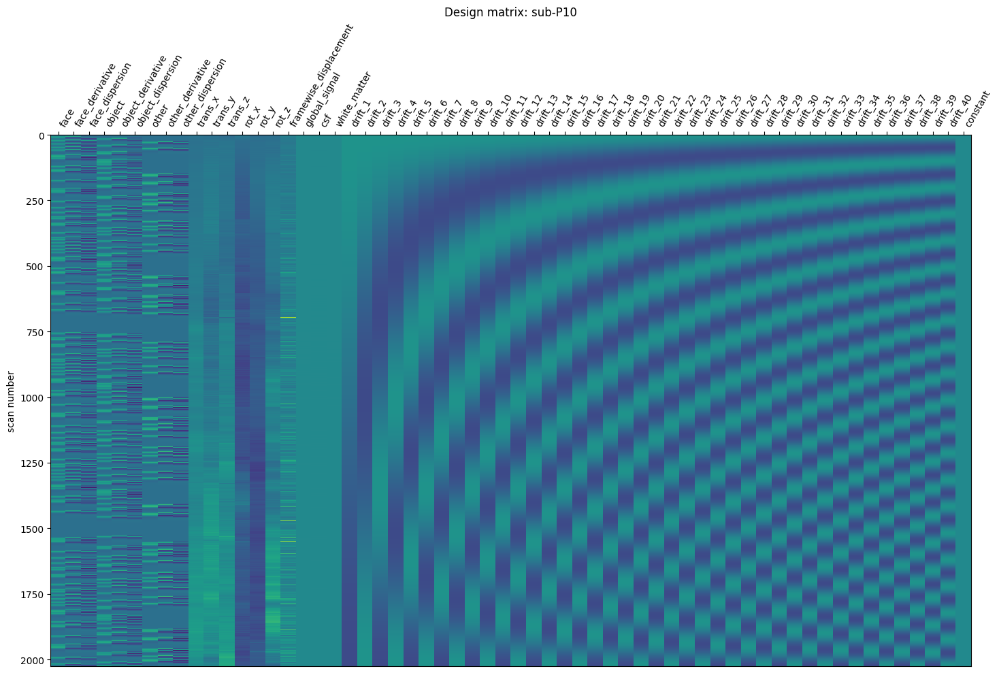

In [15]:
# --------------------------------------------------
# Inspect one design matrix
# --------------------------------------------------

test_sub = "sub-P10"
test_res = run_subject_old_ho_glm(test_sub)

plotting.plot_design_matrix(test_res["design_matrix"])
plt.title(f"Design matrix: {test_sub}")
plt.tight_layout()
plt.show()

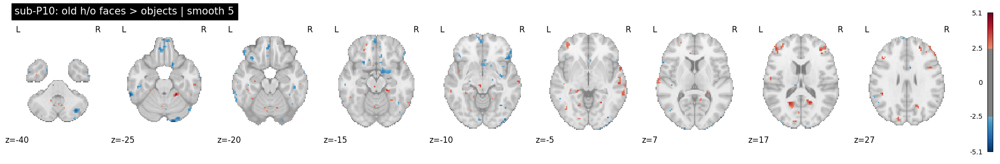

,Cluster ID,X,Y,Z,Peak Stat,Cluster Size (mm3)
0,1,-48.5,43.0,22.0,4.647009,703
1,1a,-53.5,35.5,19.5,2.901162,
2,2,-33.5,-44.5,37.0,4.354184,2625
3,2a,-33.5,-54.5,44.5,3.862197,
4,2b,-41.0,-47.0,47.0,3.616108,
5,2c,-36.0,-59.5,37.0,3.444085,
6,3,24.0,-42.0,-25.5,4.308900,437
7,3a,29.0,-34.5,-28.0,3.060634,
8,4,6.5,-44.5,2.0,4.186770,312
9,5,-38.5,5.5,37.0,4.146251,1531


In [16]:
# --------------------------------------------------
# Single-subject diagnostic: sub-P10 face > object
# --------------------------------------------------

plotting.plot_stat_map(
    test_res["z_maps"]["faces_gt_objects"],
    threshold=2.5,
    display_mode="z",
    cut_coords=[-40, -25, -20, -15, -10, -5, 7, 17, 27],
    title="sub-P10: old h/o faces > objects | smooth 5",
    colorbar=True,
)
plt.show()

p10_clusters = get_clusters_table(
    test_res["z_maps"]["faces_gt_objects"],
    stat_threshold=2.5,
    cluster_threshold=20,
)

display(p10_clusters.head(20))

In [17]:
# --------------------------------------------------
# Run first-level GLMs for all subjects
# --------------------------------------------------

first_level_summary_rows = []

contrast_maps = {
    "faces_gt_objects": [],
    "objects_gt_faces": [],
}

for sub in valid_glm_subjects:
    res = run_subject_old_ho_glm(sub)
    
    sub_dir = OUT_DIR / sub
    sub_dir.mkdir(parents=True, exist_ok=True)
    
    for contrast_name in contrast_maps.keys():
        z_path = sub_dir / f"{sub}_{contrast_name}_z.nii.gz"
        effect_path = sub_dir / f"{sub}_{contrast_name}_effect.nii.gz"
        
        res["z_maps"][contrast_name].to_filename(z_path)
        res["effect_maps"][contrast_name].to_filename(effect_path)
        
        contrast_maps[contrast_name].append(effect_path)
    
    first_level_summary_rows.append({
        "sub": sub,
        "n_face": 144,
        "n_object": 144,
        "n_other": 96,
    })

first_level_summary_df = pd.DataFrame(first_level_summary_rows)

display(first_level_summary_df)

print("Faces > objects maps:", len(contrast_maps["faces_gt_objects"]))
print("Objects > faces maps:", len(contrast_maps["objects_gt_faces"]))

/tmp/ipykernel_2314979/19236099.py:64: UserWarning: Mean values of 0 observed. The data have probably been centered. Scaling might not work as expected.
  fmri_glm = fmri_glm.fit(
/tmp/ipykernel_2314979/19236099.py:64: UserWarning: Mean values of 0 observed. The data have probably been centered. Scaling might not work as expected.
  fmri_glm = fmri_glm.fit(


,sub,n_face,n_object,n_other
0,sub-P10,144,144,96
1,sub-P12,144,144,96
2,sub-P13,144,144,96
3,sub-P14,144,144,96
4,sub-P15,144,144,96
5,sub-P16,144,144,96
6,sub-P17,144,144,96
7,sub-P18,144,144,96
8,sub-P19,144,144,96
9,sub-P20,144,144,96


Faces > objects maps: 32
Objects > faces maps: 32


## 8. Group-level GLM

At the group level, we test whether the subject-level contrast is consistently positive across participants.

For `faces > objects`, this asks:

$$
\text{Across subjects, is } \beta_{\text{face}} - \beta_{\text{object}} > 0?
$$

In [18]:
# --------------------------------------------------
# Group-level GLM
# --------------------------------------------------

def run_second_level_from_effect_maps(effect_paths, contrast_name):
    second_level_input = [str(p) for p in effect_paths]
    
    design_matrix = pd.DataFrame(
        np.ones((len(second_level_input), 1)),
        columns=["intercept"],
    )
    
    second_level_model = SecondLevelModel(
        smoothing_fwhm=None,
        n_jobs=-1,
    )
    
    second_level_model = second_level_model.fit(
        second_level_input,
        design_matrix=design_matrix,
    )
    
    group_z = second_level_model.compute_contrast(
        "intercept",
        output_type="z_score",
    )
    
    out_path = OUT_DIR / f"group_{contrast_name}_z.nii.gz"
    group_z.to_filename(out_path)
    
    return group_z


group_z_maps = {}

for contrast_name, effect_paths in contrast_maps.items():
    group_z = run_second_level_from_effect_maps(
        effect_paths,
        contrast_name,
    )
    
    group_z_maps[contrast_name] = group_z

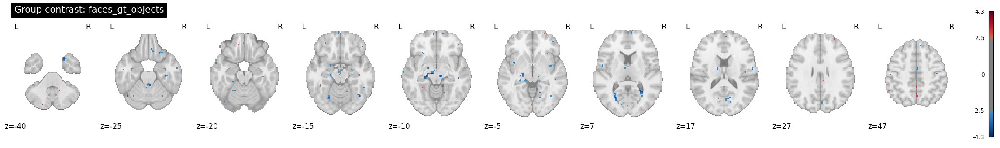

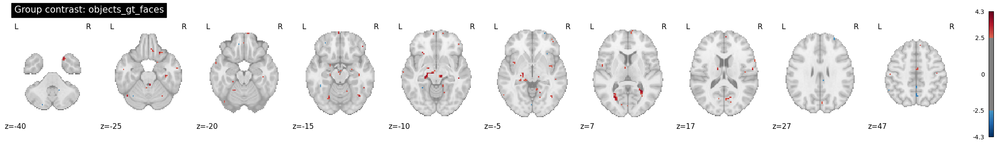

In [19]:
# --------------------------------------------------
# Plot group-level contrasts
# --------------------------------------------------

for contrast_name, group_z in group_z_maps.items():
    plotting.plot_stat_map(
        group_z,
        threshold=2.5,
        display_mode="z",
        cut_coords=[-40, -25, -20, -15, -10, -5, 7, 17, 27, 47],
        title=f"Group contrast: {contrast_name}",
        colorbar=True,
    )
    plt.show()

In [20]:
# --------------------------------------------------
# Cluster tables
# --------------------------------------------------

cluster_tables = {}

for contrast_name, group_z in group_z_maps.items():
    table = get_clusters_table(
        group_z,
        stat_threshold=2.5,
        cluster_threshold=20,
    )
    
    cluster_tables[contrast_name] = table
    
    print("\n", contrast_name)
    display(table.head(15))
    
    table.to_csv(
        OUT_DIR / f"group_{contrast_name}_clusters_z2p5_k20.csv",
        index=False,
    )


 faces_gt_objects


,Cluster ID,X,Y,Z,Peak Stat,Cluster Size (mm3)
0,1,11.5,-64.5,37.0,3.199059,343



 objects_gt_faces


,Cluster ID,X,Y,Z,Peak Stat,Cluster Size (mm3)
0,1,-8.5,-17.0,-10.5,4.259571,656
1,1a,-21.0,-24.5,-10.5,3.888933,
2,1b,-18.5,-17.0,-8.0,3.358814,
3,2,26.5,-52.0,7.0,3.981349,406
4,2a,29.0,-64.5,9.5,3.285768,
5,3,-26.0,-67.0,7.0,3.871404,312


In [21]:
# --------------------------------------------------
# Anatomical labeling of group-level peaks
# --------------------------------------------------

ho_cort = datasets.fetch_atlas_harvard_oxford("cort-maxprob-thr25-2mm")
ho_sub = datasets.fetch_atlas_harvard_oxford("sub-maxprob-thr25-2mm")

def ensure_img(atlas_maps):
    if isinstance(atlas_maps, nib.spatialimages.SpatialImage):
        return atlas_maps
    return nib.load(atlas_maps)

cort_img = ensure_img(ho_cort.maps)
sub_img = ensure_img(ho_sub.maps)

cort_labels = ho_cort.labels
sub_labels = ho_sub.labels


def label_peak_with_atlas(x, y, z, atlas_img, atlas_labels):
    ijk = np.round(
        nib.affines.apply_affine(
            np.linalg.inv(atlas_img.affine),
            [x, y, z],
        )
    ).astype(int)
    
    data = atlas_img.get_fdata()
    
    if np.any(ijk < 0) or np.any(ijk >= np.array(data.shape)):
        return "Outside atlas"
    
    label_idx = int(data[tuple(ijk)])
    
    if label_idx < len(atlas_labels):
        return atlas_labels[label_idx]
    
    return f"Label index {label_idx}"


labeled_peak_rows = []

for contrast_name, table in cluster_tables.items():
    for _, row in table.head(15).iterrows():
        x, y, z = row["X"], row["Y"], row["Z"]
        
        size_col = (
            "Cluster Size (mm3)"
            if "Cluster Size (mm3)" in table.columns
            else "Cluster Size"
        )
        
        labeled_peak_rows.append({
            "contrast": contrast_name,
            "cluster_id": row["Cluster ID"],
            "x": x,
            "y": y,
            "z": z,
            "peak_stat": row["Peak Stat"],
            "cluster_size": row[size_col] if size_col in table.columns else np.nan,
            "cortical_label": label_peak_with_atlas(x, y, z, cort_img, cort_labels),
            "subcortical_label": label_peak_with_atlas(x, y, z, sub_img, sub_labels),
        })

labeled_peaks_df = pd.DataFrame(labeled_peak_rows)

display(labeled_peaks_df)

labeled_peaks_df.to_csv(
    OUT_DIR / "group_old_ho_faces_objects_labeled_peaks.csv",
    index=False,
)

[fetch_atlas_harvard_oxford] Dataset found in /home/kroczak/nilearn_data/fsl
[fetch_atlas_harvard_oxford] Dataset found in /home/kroczak/nilearn_data/fsl


,contrast,cluster_id,x,y,z,peak_stat,cluster_size,cortical_label,subcortical_label
0,faces_gt_objects,1.0,11.5,-64.5,37.0,3.199059,343.0,Precuneous Cortex,Right Cerebral Cortex
1,objects_gt_faces,1,-8.5,-17.0,-10.5,4.259571,656,Background,Background
2,objects_gt_faces,1a,-21.0,-24.5,-10.5,3.888933,,Background,Background
3,objects_gt_faces,1b,-18.5,-17.0,-8.0,3.358814,,Background,Left Cerebral White Matter
4,objects_gt_faces,2,26.5,-52.0,7.0,3.981349,406,Precuneous Cortex,Right Cerebral White Matter
5,objects_gt_faces,2a,29.0,-64.5,9.5,3.285768,,Background,Right Cerebral White Matter
6,objects_gt_faces,3,-26.0,-67.0,7.0,3.871404,312,Background,Left Cerebral White Matter


In [22]:
# --------------------------------------------------
# ROI-level check in fusiform and ventral visual cortex
# --------------------------------------------------

ho_cort = datasets.fetch_atlas_harvard_oxford("cort-maxprob-thr25-2mm")
cort_img = ensure_img(ho_cort.maps)
cort_labels = ho_cort.labels
cort_data = cort_img.get_fdata()


def make_cortical_mask_from_keywords(keywords):
    mask_data = np.zeros(cort_data.shape, dtype=np.int16)
    matched_labels = []
    
    for idx, label in enumerate(cort_labels):
        if any(keyword.lower() in label.lower() for keyword in keywords):
            mask_data[cort_data == idx] = 1
            matched_labels.append(label)
    
    mask_img = nib.Nifti1Image(
        mask_data,
        affine=cort_img.affine,
        header=cort_img.header,
    )
    
    return mask_img, matched_labels


fusiform_mask, fusiform_labels = make_cortical_mask_from_keywords([
    "Temporal Fusiform Cortex",
    "Occipital Fusiform Gyrus",
])

lateral_occipital_mask, lo_labels = make_cortical_mask_from_keywords([
    "Lateral Occipital Cortex",
])

ventral_visual_mask, vv_labels = make_cortical_mask_from_keywords([
    "Temporal Fusiform Cortex",
    "Occipital Fusiform Gyrus",
    "Inferior Temporal Gyrus",
    "Middle Temporal Gyrus",
    "Lateral Occipital Cortex",
])

roi_masks = {
    "fusiform": fusiform_mask,
    "lateral_occipital": lateral_occipital_mask,
    "ventral_visual": ventral_visual_mask,
}

print("Fusiform labels:", fusiform_labels)
print("Lateral occipital labels:", lo_labels)

[fetch_atlas_harvard_oxford] Dataset found in /home/kroczak/nilearn_data/fsl
Fusiform labels: ['Temporal Fusiform Cortex, anterior division', 'Temporal Fusiform Cortex, posterior division', 'Occipital Fusiform Gyrus']
Lateral occipital labels: ['Lateral Occipital Cortex, superior division', 'Lateral Occipital Cortex, inferior division']


In [23]:
# --------------------------------------------------
# Extract subject-level face > object effects in ROIs
# --------------------------------------------------

roi_rows = []

for sub in valid_glm_subjects:
    effect_path = OUT_DIR / sub / f"{sub}_faces_gt_objects_effect.nii.gz"
    effect_img = nib.load(str(effect_path))
    
    for roi_name, roi_mask in roi_masks.items():
        roi_mask_resampled = image.resample_to_img(
            roi_mask,
            effect_img,
            interpolation="nearest",
            force_resample=True,
            copy_header=True,
        )
        
        effect_data = effect_img.get_fdata()
        mask_data = roi_mask_resampled.get_fdata().astype(bool)
        
        mean_effect = np.nanmean(effect_data[mask_data])
        
        roi_rows.append({
            "sub": sub,
            "roi": roi_name,
            "faces_gt_objects_effect": mean_effect,
        })

roi_subject_df = pd.DataFrame(roi_rows)

roi_stats_rows = []

for roi_name, df in roi_subject_df.groupby("roi"):
    values = df["faces_gt_objects_effect"].dropna()
    
    t_res = ttest_1samp(values, 0)
    
    try:
        w_p = wilcoxon(values).pvalue
    except Exception:
        w_p = np.nan
    
    roi_stats_rows.append({
        "roi": roi_name,
        "n": len(values),
        "mean_effect": values.mean(),
        "std": values.std(),
        "n_positive": (values > 0).sum(),
        "n_negative": (values < 0).sum(),
        "t": t_res.statistic,
        "p": t_res.pvalue,
        "wilcoxon_p": w_p,
    })

roi_stats_df = pd.DataFrame(roi_stats_rows)

display(roi_stats_df)

roi_subject_df.to_csv(
    OUT_DIR / "old_ho_faces_objects_roi_subject_effects.csv",
    index=False,
)

roi_stats_df.to_csv(
    OUT_DIR / "old_ho_faces_objects_roi_stats.csv",
    index=False,
)

,roi,n,mean_effect,std,n_positive,n_negative,t,p,wilcoxon_p
0,fusiform,32,-0.007327,0.055985,14,18,-0.740293,0.464693,0.216887
1,lateral_occipital,32,-0.001080,0.044672,15,17,-0.136761,0.892104,0.992644
2,ventral_visual,32,-0.006834,0.042196,14,18,-0.916159,0.366656,0.598773


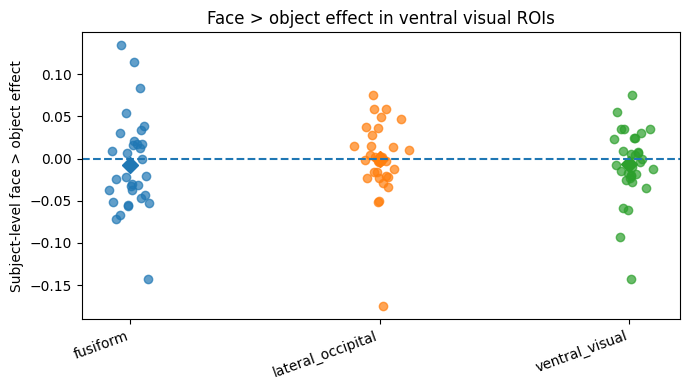

In [24]:
# --------------------------------------------------
# Plot subject-level ROI effects
# --------------------------------------------------

plt.figure(figsize=(7, 4))

roi_order = ["fusiform", "lateral_occipital", "ventral_visual"]

for i, roi_name in enumerate(roi_order):
    values = roi_subject_df.query("roi == @roi_name")["faces_gt_objects_effect"].dropna().values
    x = np.repeat(i, len(values)) + np.random.normal(0, 0.04, len(values))
    
    plt.scatter(x, values, alpha=0.7)
    plt.plot(i, values.mean(), marker="D", markersize=8)

plt.axhline(0, linestyle="--")
plt.xticks(range(len(roi_order)), roi_order, rotation=20, ha="right")
plt.ylabel("Subject-level face > object effect")
plt.title("Face > object effect in ventral visual ROIs")
plt.tight_layout()
plt.show()

Excluding high-motion subjects: ['sub-P21', 'sub-P19']
Sensitivity sample size: 30


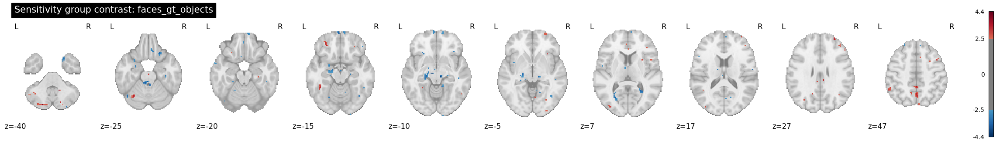

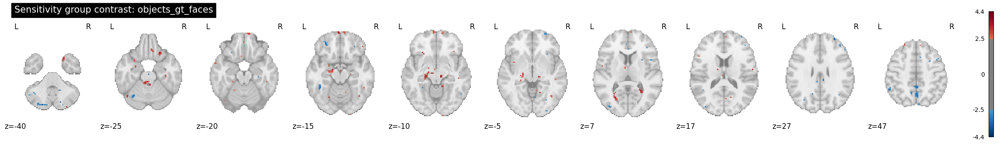

In [25]:
# --------------------------------------------------
# Sensitivity group-level analysis excluding high-motion subjects
# --------------------------------------------------

high_motion_subjects = combined_qc_summary.query(
    "flag_high_mean_fd"
)["sub"].tolist()

sensitivity_subjects = [
    sub for sub in valid_glm_subjects
    if sub not in high_motion_subjects
]

print("Excluding high-motion subjects:", high_motion_subjects)
print("Sensitivity sample size:", len(sensitivity_subjects))


sensitivity_contrast_maps = {
    "faces_gt_objects": [],
    "objects_gt_faces": [],
}

for sub in sensitivity_subjects:
    for contrast_name in sensitivity_contrast_maps.keys():
        effect_path = OUT_DIR / sub / f"{sub}_{contrast_name}_effect.nii.gz"
        sensitivity_contrast_maps[contrast_name].append(effect_path)


sensitivity_group_z_maps = {}

for contrast_name, effect_paths in sensitivity_contrast_maps.items():
    second_level_input = [str(p) for p in effect_paths]
    
    design_matrix = pd.DataFrame(
        np.ones((len(second_level_input), 1)),
        columns=["intercept"],
    )
    
    second_level_model = SecondLevelModel(
        smoothing_fwhm=None,
        n_jobs=-1,
    )
    
    second_level_model = second_level_model.fit(
        second_level_input,
        design_matrix=design_matrix,
    )
    
    group_z = second_level_model.compute_contrast(
        "intercept",
        output_type="z_score",
    )
    
    sensitivity_group_z_maps[contrast_name] = group_z
    
    group_z.to_filename(
        OUT_DIR / f"group_{contrast_name}_z_excluding_high_motion.nii.gz"
    )
    
    plotting.plot_stat_map(
        group_z,
        threshold=2.5,
        display_mode="z",
        cut_coords=[-40, -25, -20, -15, -10, -5, 7, 17, 27, 47],
        title=f"Sensitivity group contrast: {contrast_name}",
        colorbar=True,
    )
    plt.show()

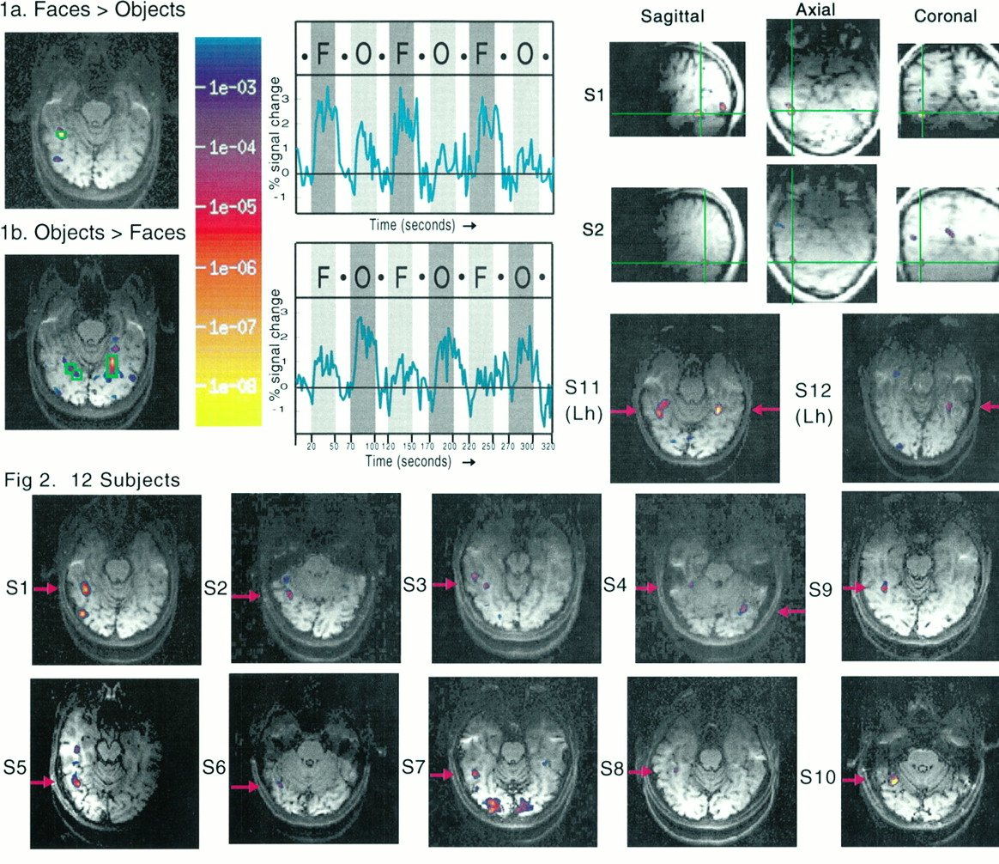

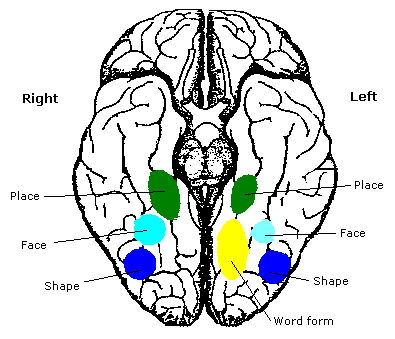

In [26]:
# --------------------------------------------------
# Sensitivity cluster tables
# --------------------------------------------------

sensitivity_cluster_tables = {}

for contrast_name, group_z in sensitivity_group_z_maps.items():
    table = get_clusters_table(
        group_z,
        stat_threshold=2.5,
        cluster_threshold=20,
    )
    
    sensitivity_cluster_tables[contrast_name] = table
    
    print("\nSensitivity:", contrast_name)
    display(table.head(15))


Sensitivity: faces_gt_objects


,Cluster ID,X,Y,Z,Peak Stat,Cluster Size (mm3)
0,1,-53.5,-52.0,44.5,3.699801,421
1,1a,-51.0,-44.5,42.0,3.169818,
2,2,11.5,-64.5,37.0,3.638981,890
3,2a,19.0,-74.5,39.5,3.007778,
4,3,-46.0,-44.5,-13.0,3.626184,343
5,4,4.0,-47.0,49.5,3.610516,312
6,5,-33.5,-87.0,4.5,3.608372,421
7,6,41.5,33.0,19.5,3.495265,671
8,6a,39.0,53.0,19.5,3.031858,
9,6b,44.0,38.0,22.0,3.022975,



Sensitivity: objects_gt_faces


,Cluster ID,X,Y,Z,Peak Stat,Cluster Size (mm3)
0,1,-18.5,-24.5,-8.0,3.819716,937
1,1a,-16.0,-9.5,-15.5,3.287386,
2,1b,-16.0,-32.0,-8.0,2.715718,
3,2,51.5,-69.5,2.0,3.475881,312


## 9. Single-subject validation: sub-P10

Because the group-level `faces > objects` effect was weak, I next inspect one subject-level GLM in detail.

This is useful because the original Kanwisher et al. FFA paper also emphasized subject-level localization: they found a fusiform region responding more to faces than objects in 12 of 15 individual subjects.

Here I inspect sub-P10 because the subject-level `faces > objects` contrast showed a plausible ventral temporal peak.

In [27]:
# --------------------------------------------------
# Single-subject GLM: sub-P10
# --------------------------------------------------

single_sub = "sub-P10"

single_res = run_subject_old_ho_glm(single_sub)

single_faces_z = single_res["z_maps"]["faces_gt_objects"]
single_objects_z = single_res["z_maps"]["objects_gt_faces"]

single_faces_effect = single_res["effect_maps"]["faces_gt_objects"]
single_objects_effect = single_res["effect_maps"]["objects_gt_faces"]

print("Subject:", single_sub)
display(single_res["events"]["trial_type"].value_counts().to_frame("n_events"))

Subject: sub-P10


,n_events
trial_type,
face,144
object,144
other,96


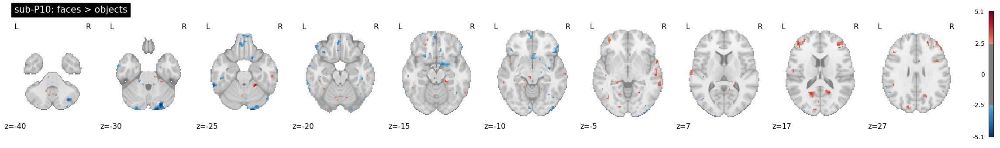

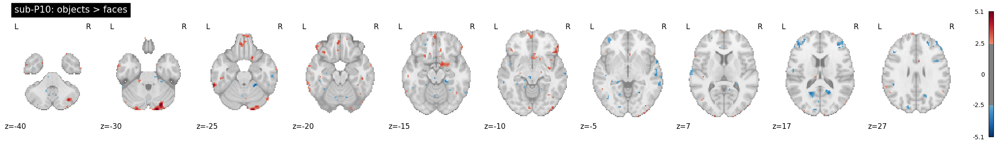

In [28]:
# --------------------------------------------------
# Plot sub-P10 face/object contrasts
# --------------------------------------------------

plotting.plot_stat_map(
    single_faces_z,
    threshold=2.5,
    display_mode="z",
    cut_coords=[-40, -30, -25, -20, -15, -10, -5, 7, 17, 27],
    title="sub-P10: faces > objects",
    colorbar=True,
)
plt.show()

plotting.plot_stat_map(
    single_objects_z,
    threshold=2.5,
    display_mode="z",
    cut_coords=[-40, -30, -25, -20, -15, -10, -5, 7, 17, 27],
    title="sub-P10: objects > faces",
    colorbar=True,
)
plt.show()

In [29]:
# --------------------------------------------------
# Cluster tables for sub-P10
# --------------------------------------------------

p10_faces_clusters = get_clusters_table(
    single_faces_z,
    stat_threshold=2.5,
    cluster_threshold=20,
)

p10_objects_clusters = get_clusters_table(
    single_objects_z,
    stat_threshold=2.5,
    cluster_threshold=20,
)

print("sub-P10 faces > objects")
display(p10_faces_clusters.head(20))

print("sub-P10 objects > faces")
display(p10_objects_clusters.head(20))

sub-P10 faces > objects


,Cluster ID,X,Y,Z,Peak Stat,Cluster Size (mm3)
0,1,-48.5,43.0,22.0,4.647009,703
1,1a,-53.5,35.5,19.5,2.901162,
2,2,-33.5,-44.5,37.0,4.354184,2625
3,2a,-33.5,-54.5,44.5,3.862197,
4,2b,-41.0,-47.0,47.0,3.616108,
5,2c,-36.0,-59.5,37.0,3.444085,
6,3,24.0,-42.0,-25.5,4.308900,437
7,3a,29.0,-34.5,-28.0,3.060634,
8,4,6.5,-44.5,2.0,4.186770,312
9,5,-38.5,5.5,37.0,4.146251,1531


sub-P10 objects > faces


,Cluster ID,X,Y,Z,Peak Stat,Cluster Size (mm3)
0,1,26.5,-82.0,-30.5,5.138200,3500
1,1a,19.0,-92.0,-28.0,5.062553,
2,1b,34.0,-72.0,-40.5,4.149753,
3,1c,24.0,-72.0,-35.5,3.571703,
4,2,-8.5,8.0,64.5,4.306006,453
5,3,-63.5,-42.0,-25.5,4.301871,406
6,3a,-68.5,-34.5,-20.5,2.989597,
7,4,11.5,53.0,-28.0,3.871081,359
8,4a,-1.0,60.5,-25.5,3.395378,
9,5,49.0,25.5,-13.0,3.847489,718


In [30]:
# --------------------------------------------------
# Anatomical labeling of sub-P10 peaks
# --------------------------------------------------

ho_cort = datasets.fetch_atlas_harvard_oxford("cort-maxprob-thr25-2mm")
ho_sub = datasets.fetch_atlas_harvard_oxford("sub-maxprob-thr25-2mm")

def ensure_img(atlas_maps):
    if isinstance(atlas_maps, nib.spatialimages.SpatialImage):
        return atlas_maps
    return nib.load(atlas_maps)

cort_img = ensure_img(ho_cort.maps)
sub_img = ensure_img(ho_sub.maps)

cort_labels = ho_cort.labels
sub_labels = ho_sub.labels


def label_peak_with_atlas(x, y, z, atlas_img, atlas_labels):
    ijk = np.round(
        nib.affines.apply_affine(
            np.linalg.inv(atlas_img.affine),
            [x, y, z],
        )
    ).astype(int)
    
    data = atlas_img.get_fdata()
    
    if np.any(ijk < 0) or np.any(ijk >= np.array(data.shape)):
        return "Outside atlas"
    
    label_idx = int(data[tuple(ijk)])
    
    if label_idx < len(atlas_labels):
        return atlas_labels[label_idx]
    
    return f"Label index {label_idx}"


p10_labeled_rows = []

for contrast_name, table in {
    "faces_gt_objects": p10_faces_clusters,
    "objects_gt_faces": p10_objects_clusters,
}.items():
    for _, row in table.head(20).iterrows():
        x, y, z = row["X"], row["Y"], row["Z"]
        
        size_col = (
            "Cluster Size (mm3)"
            if "Cluster Size (mm3)" in table.columns
            else "Cluster Size"
        )
        
        p10_labeled_rows.append({
            "sub": single_sub,
            "contrast": contrast_name,
            "cluster_id": row["Cluster ID"],
            "x": x,
            "y": y,
            "z": z,
            "peak_stat": row["Peak Stat"],
            "cluster_size": row[size_col] if size_col in table.columns else np.nan,
            "cortical_label": label_peak_with_atlas(x, y, z, cort_img, cort_labels),
            "subcortical_label": label_peak_with_atlas(x, y, z, sub_img, sub_labels),
        })

p10_labeled_peaks_df = pd.DataFrame(p10_labeled_rows)

display(p10_labeled_peaks_df)

p10_labeled_peaks_df.to_csv(
    OUT_DIR / "sub-P10_faces_objects_labeled_peaks.csv",
    index=False,
)

[fetch_atlas_harvard_oxford] Dataset found in /home/kroczak/nilearn_data/fsl
[fetch_atlas_harvard_oxford] Dataset found in /home/kroczak/nilearn_data/fsl


,sub,contrast,cluster_id,x,y,z,peak_stat,cluster_size,cortical_label,subcortical_label
0,sub-P10,faces_gt_objects,1,-48.5,43.0,22.0,4.647009,703,Frontal Pole,Left Cerebral Cortex
1,sub-P10,faces_gt_objects,1a,-53.5,35.5,19.5,2.901162,,Background,Background
2,sub-P10,faces_gt_objects,2,-33.5,-44.5,37.0,4.354184,2625,Background,Left Cerebral White Matter
3,sub-P10,faces_gt_objects,2a,-33.5,-54.5,44.5,3.862197,,Superior Parietal Lobule,Left Cerebral Cortex
4,sub-P10,faces_gt_objects,2b,-41.0,-47.0,47.0,3.616108,,"Supramarginal Gyrus, posterior division",Left Cerebral Cortex
5,sub-P10,faces_gt_objects,2c,-36.0,-59.5,37.0,3.444085,,"Lateral Occipital Cortex, superior division",Left Cerebral White Matter
6,sub-P10,faces_gt_objects,3,24.0,-42.0,-25.5,4.308900,437,Background,Background
7,sub-P10,faces_gt_objects,3a,29.0,-34.5,-28.0,3.060634,,Background,Right Cerebral Cortex
8,sub-P10,faces_gt_objects,4,6.5,-44.5,2.0,4.186770,312,Background,Right Cerebral Cortex
9,sub-P10,faces_gt_objects,5,-38.5,5.5,37.0,4.146251,1531,Middle Frontal Gyrus,Left Cerebral Cortex


In [31]:
# --------------------------------------------------
# Select literature-relevant visual-category peaks
# --------------------------------------------------

visual_keywords = [
    "fusiform",
    "temporal",
    "occipital",
    "lateral occipital",
    "inferior temporal",
    "middle temporal",
]

def is_visual_category_label(label):
    label = str(label).lower()
    return any(k in label for k in visual_keywords)


p10_visual_peaks_df = p10_labeled_peaks_df[
    p10_labeled_peaks_df["cortical_label"].apply(is_visual_category_label)
    | p10_labeled_peaks_df["subcortical_label"].apply(is_visual_category_label)
].copy()

display(p10_visual_peaks_df)

,sub,contrast,cluster_id,x,y,z,peak_stat,cluster_size,cortical_label,subcortical_label
5,sub-P10,faces_gt_objects,2c,-36.0,-59.5,37.0,3.444085,,"Lateral Occipital Cortex, superior division",Left Cerebral White Matter
19,sub-P10,faces_gt_objects,8a,61.5,8.0,-5.5,3.430813,,Temporal Pole,Right Cerebral Cortex


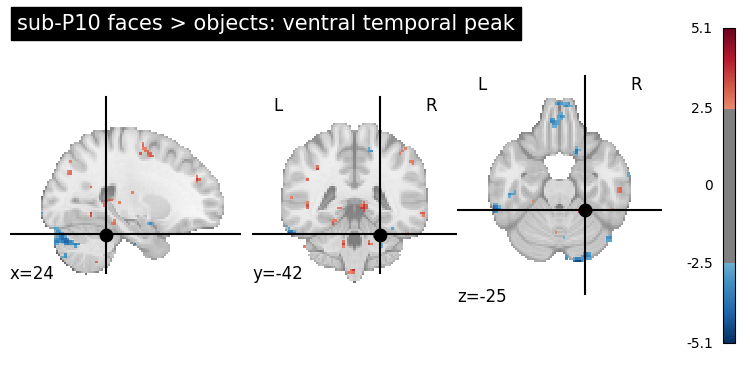

In [33]:
# --------------------------------------------------
# Visualize sub-P10 face > object with relevant peak marker
# --------------------------------------------------

face_ventral_temporal_peak = np.array([[24.0, -42.0, -25.5]])

display = plotting.plot_stat_map(
    single_faces_z,
    threshold=2.5,
    display_mode="ortho",
    cut_coords=(24, -42, -25),
    title="sub-P10 faces > objects: ventral temporal peak",
    colorbar=True,
)

display.add_markers(
    marker_coords=face_ventral_temporal_peak,
    marker_color="black",
    marker_size=80,
)

plt.show()

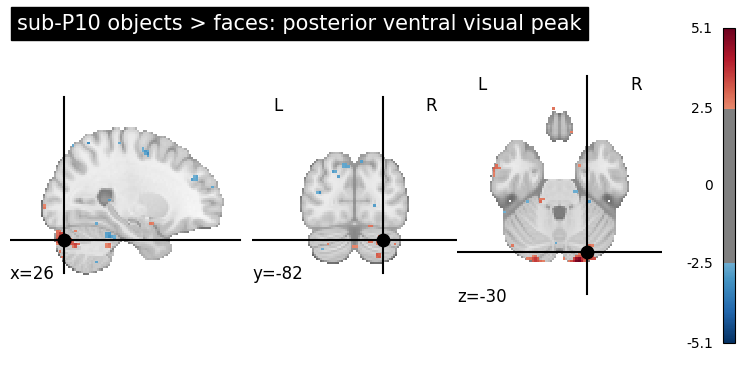

In [34]:
# --------------------------------------------------
# Visualize sub-P10 object > face with relevant peak marker
# --------------------------------------------------

object_posterior_ventral_peak = np.array([[26.5, -82.0, -30.5]])

display = plotting.plot_stat_map(
    single_objects_z,
    threshold=2.5,
    display_mode="ortho",
    cut_coords=(26.5, -82.0, -30.5),
    title="sub-P10 objects > faces: posterior ventral visual peak",
    colorbar=True,
)

display.add_markers(
    marker_coords=object_posterior_ventral_peak,
    marker_color="black",
    marker_size=80,
)

plt.show()

## Interactive coordinate exploration

Kanwisher et al. (1997) reported Talairach coordinates for face-selective fusiform activations in individual subjects. Our maps are in MNI space, so the comparison is approximate. However, it is still useful as an anatomical sanity check.

The cells below allow interactive exploration of:

- sub-P10 `faces > objects`
- group sensitivity `faces > objects`
- Kanwisher FFA coordinates from Table 1
- distances between our peaks and the literature coordinates

In [76]:
# --------------------------------------------------
# Fix overwritten Jupyter display function
# --------------------------------------------------

from IPython.display import display as ipy_display

ipy_display(kanwisher_ffa_coords)
ipy_display(our_peak_coords)

# --------------------------------------------------
# Kanwisher et al. (1997) FFA coordinates and our peaks
# --------------------------------------------------

# Kanwisher Table 1 fusiform face area coordinates.
# These are Talairach coordinates, while our images are MNI.
# We use them here as approximate reference points.
kanwisher_ffa_coords = pd.DataFrame([
    {"subject": "S1",  "x": 40,  "y": -48, "z": -12, "handedness": "right"},
    {"subject": "S2",  "x": 37,  "y": -57, "z": -9,  "handedness": "right"},
    {"subject": "S3",  "x": 43,  "y": -54, "z": -18, "handedness": "right"},
    {"subject": "S4_R", "x": 31, "y": -62, "z": -6,  "handedness": "right"},
    {"subject": "S4_L", "x": -31, "y": -62, "z": -15, "handedness": "right"},
    {"subject": "S5",  "x": 50,  "y": -63, "z": -9,  "handedness": "right"},
    {"subject": "S6_R", "x": 37, "y": -69, "z": -3,  "handedness": "right"},
    {"subject": "S6_L", "x": -34, "y": -69, "z": 0,  "handedness": "right"},
    {"subject": "S7_R", "x": 46, "y": -54, "z": -12, "handedness": "right"},
    {"subject": "S7_L", "x": -40, "y": -69, "z": -12, "handedness": "right"},
    {"subject": "S8_R", "x": 40, "y": -39, "z": -6,  "handedness": "right"},
    {"subject": "S8_L", "x": -34, "y": -75, "z": -3, "handedness": "right"},
    {"subject": "S9",  "x": 40,  "y": -51, "z": -12, "handedness": "right"},
    {"subject": "S10_R", "x": 34, "y": -57, "z": -15, "handedness": "right"},
    {"subject": "S10_L", "x": -37, "y": -41, "z": -12, "handedness": "right"},
    {"subject": "S11_L", "x": -37, "y": -42, "z": -12, "handedness": "left"},
    {"subject": "S11_R", "x": 40, "y": -48, "z": -12, "handedness": "left"},
    {"subject": "S12", "x": -34, "y": -48, "z": -6, "handedness": "left"},
])

# Our relevant peaks
our_peak_coords = pd.DataFrame([
    {
        "peak_name": "sub-P10 faces > objects ventral temporal",
        "x": 24.0,
        "y": -42.0,
        "z": -25.5,
        "source": "sub-P10",
    },
    {
        "peak_name": "sub-P10 objects > faces posterior ventral visual",
        "x": 26.5,
        "y": -82.0,
        "z": -30.5,
        "source": "sub-P10",
    },
    {
        "peak_name": "sensitivity group faces > objects left ventral temporal",
        "x": -46.0,
        "y": -44.5,
        "z": -13.0,
        "source": "group sensitivity",
    },
])

ipy_display(kanwisher_ffa_coords)
ipy_display(our_peak_coords)

,subject,x,y,z,handedness
0,S1,40,-48,-12,right
1,S2,37,-57,-9,right
2,S3,43,-54,-18,right
3,S4_R,31,-62,-6,right
4,S4_L,-31,-62,-15,right
5,S5,50,-63,-9,right
6,S6_R,37,-69,-3,right
7,S6_L,-34,-69,0,right
8,S7_R,46,-54,-12,right
9,S7_L,-40,-69,-12,right


,peak_name,x,y,z,source
0,sub-P10 faces > objects ventral temporal,24.0,-42.0,-25.5,sub-P10
1,sub-P10 objects > faces posterior ventral visual,26.5,-82.0,-30.5,sub-P10
2,sensitivity group faces > objects left ventral...,-46.0,-44.5,-13.0,group sensitivity


,subject,x,y,z,handedness
0,S1,40,-48,-12,right
1,S2,37,-57,-9,right
2,S3,43,-54,-18,right
3,S4_R,31,-62,-6,right
4,S4_L,-31,-62,-15,right
5,S5,50,-63,-9,right
6,S6_R,37,-69,-3,right
7,S6_L,-34,-69,0,right
8,S7_R,46,-54,-12,right
9,S7_L,-40,-69,-12,right


,peak_name,x,y,z,source
0,sub-P10 faces > objects ventral temporal,24.0,-42.0,-25.5,sub-P10
1,sub-P10 objects > faces posterior ventral visual,26.5,-82.0,-30.5,sub-P10
2,sensitivity group faces > objects left ventral...,-46.0,-44.5,-13.0,group sensitivity


In [77]:
# --------------------------------------------------
# Load anatomical MNI background for interactive viewers
# --------------------------------------------------

mni_template = datasets.load_mni152_template(resolution=2)

# Optional: check that it loaded correctly
print(mni_template.shape)

(99, 117, 95)


/home/kroczak/.conda/envs/island/lib/python3.10/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)


/tmp/ipykernel_2314979/3085903147.py:5: UserWarning: It seems you have created more than 10 nilearn views. As each view uses dozens of megabytes of RAM, you might want to delete some of them.
  view_p10_faces = plotting.view_img(



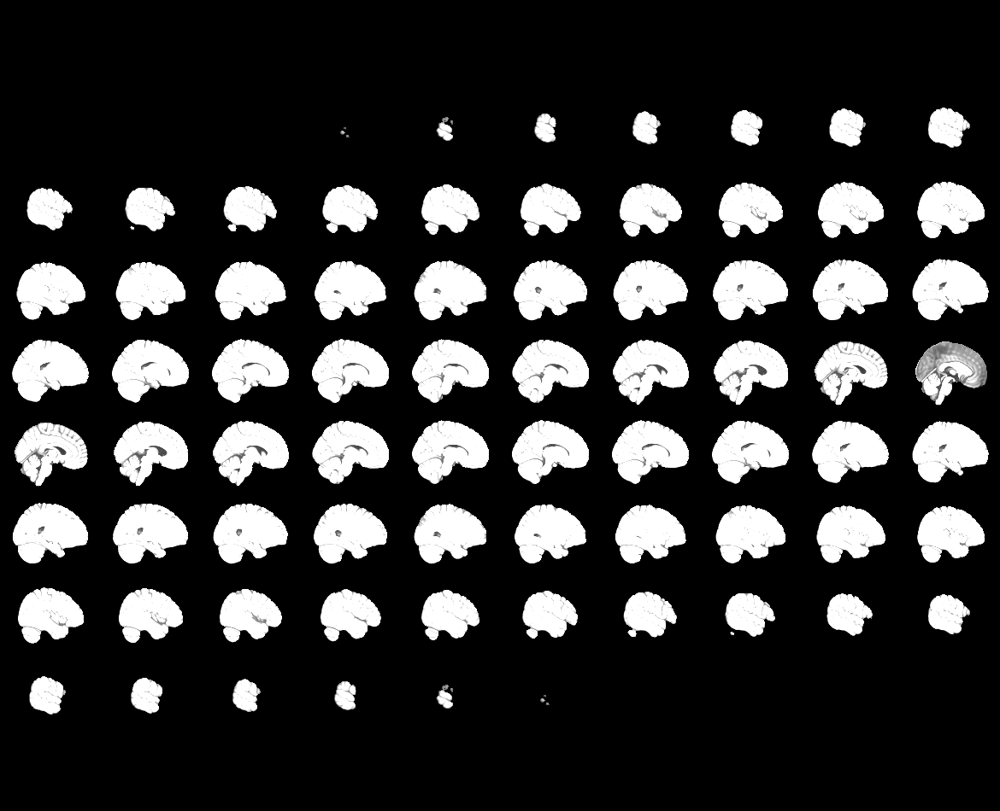
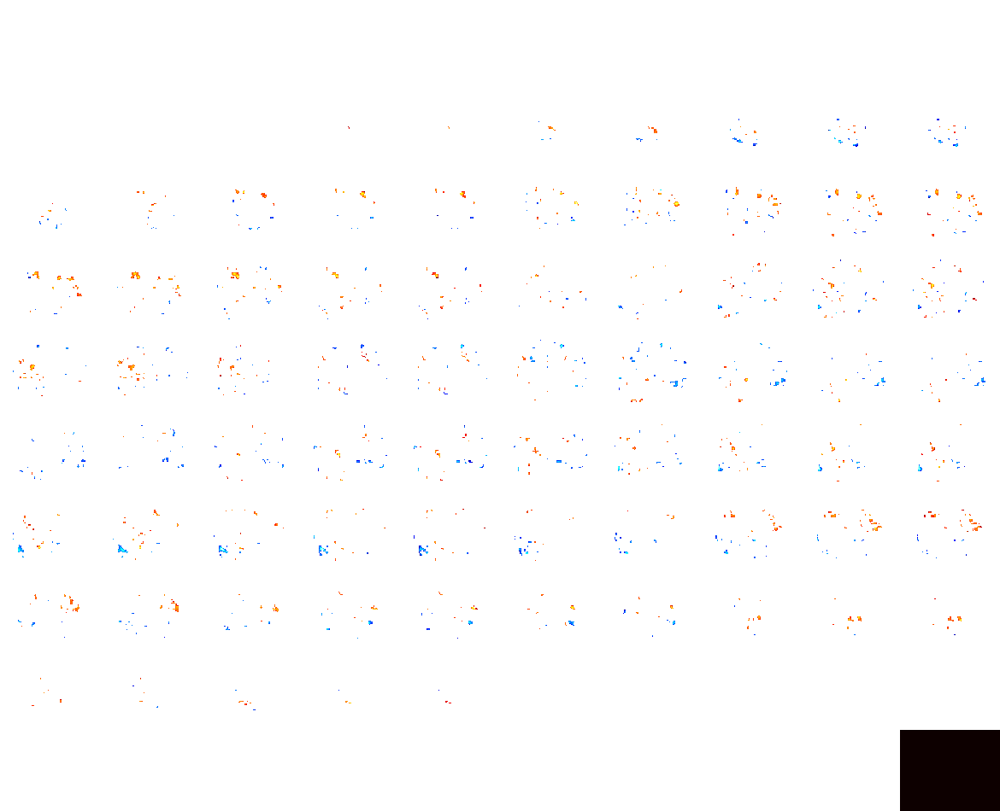

In [78]:
# --------------------------------------------------
# Interactive sub-P10 faces > objects map with anatomical background
# --------------------------------------------------

view_p10_faces = plotting.view_img(
    single_faces_z,
    bg_img=mni_template,
    threshold=2.5,
    cmap="cold_hot",
    symmetric_cmap=True,
    title="sub-P10 faces > objects | z > 2.5",
    dim=-1,
)

view_p10_faces

/home/kroczak/.conda/envs/island/lib/python3.10/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)
/tmp/ipykernel_2314979/2049285750.py:5: UserWarning: It seems you have created more than 10 nilearn views. As each view uses dozens of megabytes of RAM, you might want to delete some of them.
  view_p10_objects = plotting.view_img(



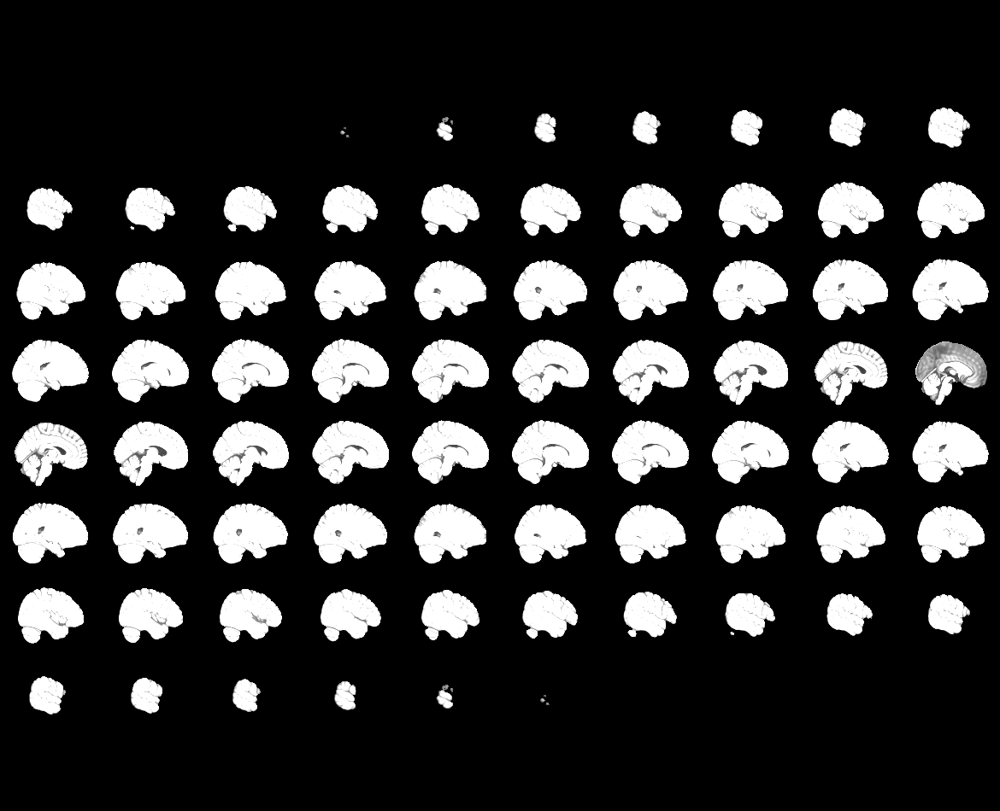
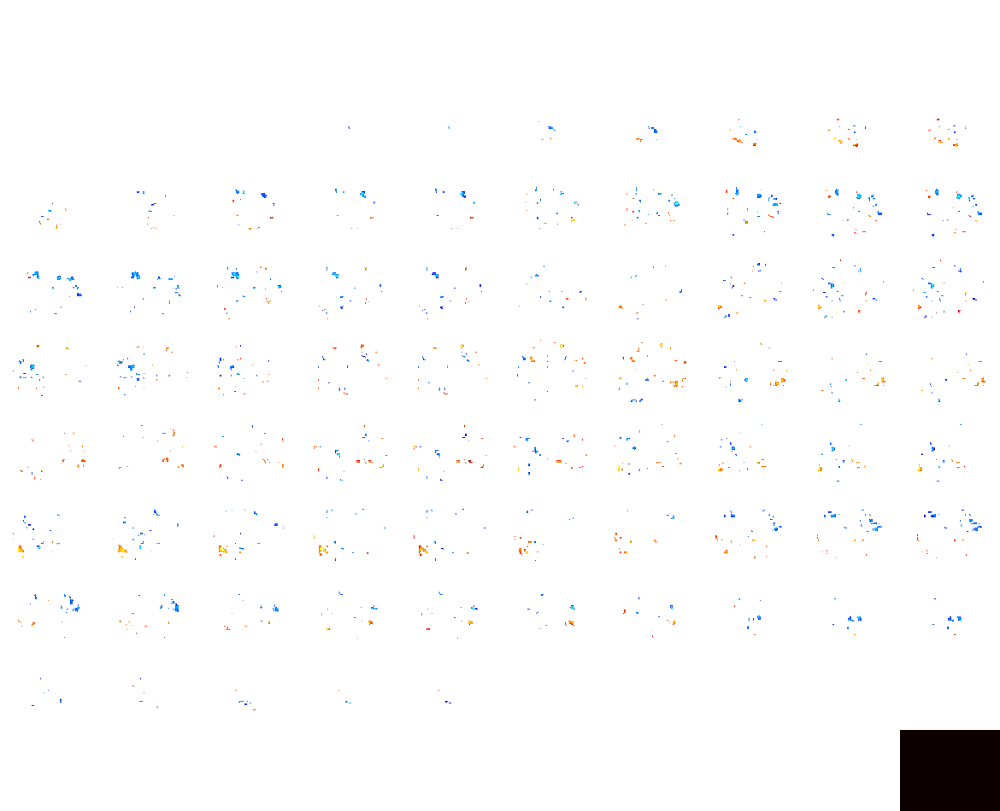

In [79]:
# --------------------------------------------------
# Interactive sub-P10 objects > faces map with anatomical background
# --------------------------------------------------

view_p10_objects = plotting.view_img(
    single_objects_z,
    bg_img=mni_template,
    threshold=2.5,
    cmap="cold_hot",
    symmetric_cmap=True,
    title="sub-P10 objects > faces | z > 2.5",
    dim=-1,
)

view_p10_objects

/home/kroczak/.conda/envs/island/lib/python3.10/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)
/tmp/ipykernel_2314979/4119686452.py:7: UserWarning: It seems you have created more than 10 nilearn views. As each view uses dozens of megabytes of RAM, you might want to delete some of them.
  view_group_faces = plotting.view_img(



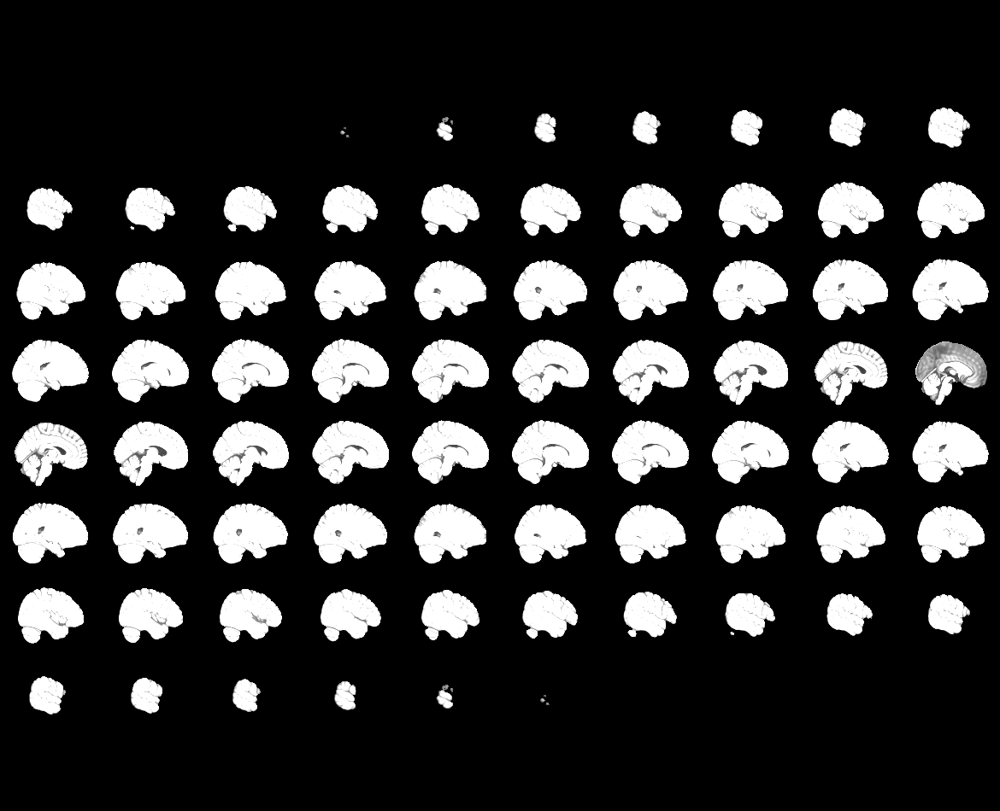
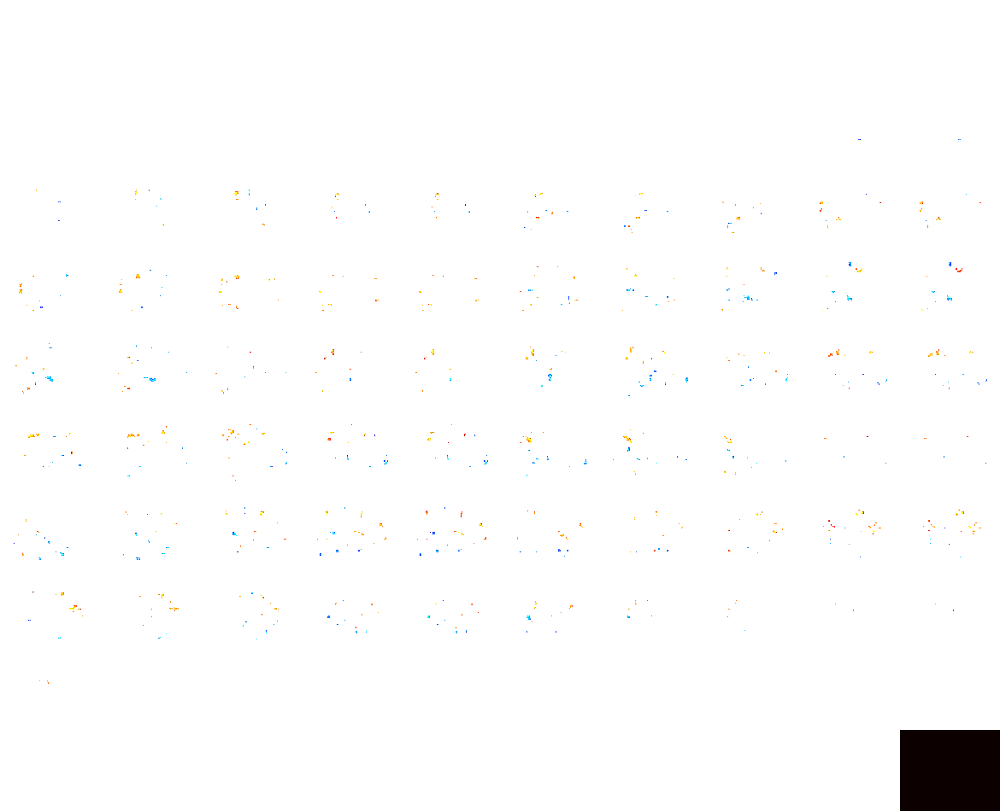

In [80]:
# --------------------------------------------------
# Interactive sensitivity group faces > objects map with anatomical background
# --------------------------------------------------

sensitivity_faces_z = sensitivity_group_z_maps["faces_gt_objects"]

view_group_faces = plotting.view_img(
    sensitivity_faces_z,
    bg_img=mni_template,
    threshold=2.5,
    cmap="cold_hot",
    symmetric_cmap=True,
    title="Sensitivity group faces > objects | z > 2.5",
    dim=-1,
)

view_group_faces

In [81]:
# --------------------------------------------------
# Interactive marker view of Kanwisher FFA coordinates
# --------------------------------------------------

kanwisher_marker_coords = kanwisher_ffa_coords[["x", "y", "z"]].values
kanwisher_marker_labels = (
    kanwisher_ffa_coords["subject"]
    + " (" 
    + kanwisher_ffa_coords["x"].astype(str)
    + ", "
    + kanwisher_ffa_coords["y"].astype(str)
    + ", "
    + kanwisher_ffa_coords["z"].astype(str)
    + ")"
)

plotting.view_markers(
    marker_coords=kanwisher_marker_coords,
    marker_color="red",
    marker_size=6,
    marker_labels=kanwisher_marker_labels.tolist(),
    title="Kanwisher et al. Table 1 FFA coordinates",
)

/tmp/ipykernel_2314979/1254045423.py:17: UserWarning: It seems you have created more than 10 nilearn views. As each view uses dozens of megabytes of RAM, you might want to delete some of them.
  plotting.view_markers(


In [82]:
# --------------------------------------------------
# Interactive marker view of our relevant peaks
# --------------------------------------------------

our_marker_coords = our_peak_coords[["x", "y", "z"]].values
our_marker_labels = (
    our_peak_coords["peak_name"]
    + " ("
    + our_peak_coords["x"].astype(str)
    + ", "
    + our_peak_coords["y"].astype(str)
    + ", "
    + our_peak_coords["z"].astype(str)
    + ")"
)

plotting.view_markers(
    marker_coords=our_marker_coords,
    marker_color="blue",
    marker_size=8,
    marker_labels=our_marker_labels.tolist(),
    title="Our relevant peaks",
)

/tmp/ipykernel_2314979/2496126479.py:17: UserWarning: It seems you have created more than 10 nilearn views. As each view uses dozens of megabytes of RAM, you might want to delete some of them.
  plotting.view_markers(


In [83]:
# --------------------------------------------------
# Distance between our peaks and Kanwisher FFA coordinates
# --------------------------------------------------

distance_rows = []

for _, our_row in our_peak_coords.iterrows():
    our_coord = np.array([our_row["x"], our_row["y"], our_row["z"]], dtype=float)
    
    for _, ref_row in kanwisher_ffa_coords.iterrows():
        ref_coord = np.array([ref_row["x"], ref_row["y"], ref_row["z"]], dtype=float)
        distance = np.linalg.norm(our_coord - ref_coord)
        
        distance_rows.append({
            "our_peak": our_row["peak_name"],
            "our_x": our_row["x"],
            "our_y": our_row["y"],
            "our_z": our_row["z"],
            "kanwisher_subject": ref_row["subject"],
            "kanwisher_x": ref_row["x"],
            "kanwisher_y": ref_row["y"],
            "kanwisher_z": ref_row["z"],
            "distance_mm_approx": distance,
        })

distance_to_kanwisher_df = pd.DataFrame(distance_rows)

ipy_display(
    distance_to_kanwisher_df
    .sort_values(["our_peak", "distance_mm_approx"])
    .groupby("our_peak")
    .head(5)
)

,our_peak,our_x,our_y,our_z,kanwisher_subject,kanwisher_x,kanwisher_y,kanwisher_z,distance_mm_approx
51,sensitivity group faces > objects left ventral...,-46.0,-44.5,-13.0,S11_L,-37,-42,-12,9.394147
50,sensitivity group faces > objects left ventral...,-46.0,-44.5,-13.0,S10_L,-37,-41,-12,9.708244
53,sensitivity group faces > objects left ventral...,-46.0,-44.5,-13.0,S12,-34,-48,-6,14.326549
40,sensitivity group faces > objects left ventral...,-46.0,-44.5,-13.0,S4_L,-31,-62,-15,23.135471
45,sensitivity group faces > objects left ventral...,-46.0,-44.5,-13.0,S7_L,-40,-69,-12,25.243811
13,sub-P10 faces > objects ventral temporal,24.0,-42.0,-25.5,S10_R,34,-57,-15,20.862646
0,sub-P10 faces > objects ventral temporal,24.0,-42.0,-25.5,S1,40,-48,-12,21.777282
16,sub-P10 faces > objects ventral temporal,24.0,-42.0,-25.5,S11_R,40,-48,-12,21.777282
12,sub-P10 faces > objects ventral temporal,24.0,-42.0,-25.5,S9,40,-51,-12,22.787058
2,sub-P10 faces > objects ventral temporal,24.0,-42.0,-25.5,S3,43,-54,-18,23.690715


In [84]:
# --------------------------------------------------
# Which sensitivity group peaks are closest to Kanwisher FFA coordinates?
# --------------------------------------------------

sensitivity_faces_table = sensitivity_cluster_tables["faces_gt_objects"].copy()

match_rows = []

for _, peak_row in sensitivity_faces_table.iterrows():
    peak_coord = np.array([peak_row["X"], peak_row["Y"], peak_row["Z"]], dtype=float)
    
    for _, ref_row in kanwisher_ffa_coords.iterrows():
        ref_coord = np.array([ref_row["x"], ref_row["y"], ref_row["z"]], dtype=float)
        distance = np.linalg.norm(peak_coord - ref_coord)
        
        match_rows.append({
            "cluster_id": peak_row["Cluster ID"],
            "peak_x": peak_row["X"],
            "peak_y": peak_row["Y"],
            "peak_z": peak_row["Z"],
            "peak_stat": peak_row["Peak Stat"],
            "kanwisher_subject": ref_row["subject"],
            "kanwisher_x": ref_row["x"],
            "kanwisher_y": ref_row["y"],
            "kanwisher_z": ref_row["z"],
            "distance_mm_approx": distance,
        })

sensitivity_kanwisher_match_df = pd.DataFrame(match_rows)

ipy_display(
    sensitivity_kanwisher_match_df
    .sort_values("distance_mm_approx")
    .head(20)
)

,cluster_id,peak_x,peak_y,peak_z,peak_stat,kanwisher_subject,kanwisher_x,kanwisher_y,kanwisher_z,distance_mm_approx
87,3,-46.0,-44.5,-13.0,3.626184,S11_L,-37,-42,-12,9.394147
86,3,-46.0,-44.5,-13.0,3.626184,S10_L,-37,-41,-12,9.708244
119,5,-33.5,-87.0,4.5,3.608372,S8_L,-34,-75,-3,14.159802
89,3,-46.0,-44.5,-13.0,3.626184,S12,-34,-48,-6,14.326549
115,5,-33.5,-87.0,4.5,3.608372,S6_L,-34,-69,0,18.560711
76,3,-46.0,-44.5,-13.0,3.626184,S4_L,-31,-62,-15,23.135471
81,3,-46.0,-44.5,-13.0,3.626184,S7_L,-40,-69,-12,25.243811
117,5,-33.5,-87.0,4.5,3.608372,S7_L,-40,-69,-12,25.268558
79,3,-46.0,-44.5,-13.0,3.626184,S6_L,-34,-69,0,30.220026
112,5,-33.5,-87.0,4.5,3.608372,S4_L,-31,-62,-15,31.804088


In [85]:
# --------------------------------------------------
# Flag group peaks near the Kanwisher FFA coordinate cloud
# --------------------------------------------------

near_ffa_matches = sensitivity_kanwisher_match_df.copy()
near_ffa_matches["within_15mm"] = near_ffa_matches["distance_mm_approx"] <= 15
near_ffa_matches["within_20mm"] = near_ffa_matches["distance_mm_approx"] <= 20

ipy_display(
    near_ffa_matches
    .query("within_20mm")
    .sort_values("distance_mm_approx")
)

,cluster_id,peak_x,peak_y,peak_z,peak_stat,kanwisher_subject,kanwisher_x,kanwisher_y,kanwisher_z,distance_mm_approx,within_15mm,within_20mm
87,3,-46.0,-44.5,-13.0,3.626184,S11_L,-37,-42,-12,9.394147,True,True
86,3,-46.0,-44.5,-13.0,3.626184,S10_L,-37,-41,-12,9.708244,True,True
119,5,-33.5,-87.0,4.5,3.608372,S8_L,-34,-75,-3,14.159802,True,True
89,3,-46.0,-44.5,-13.0,3.626184,S12,-34,-48,-6,14.326549,True,True
115,5,-33.5,-87.0,4.5,3.608372,S6_L,-34,-69,0,18.560711,False,True


In [86]:
# --------------------------------------------------
# Convert our MNI coordinates to approximate Talairach coordinates
# using the Lancaster icbm_spm2tal affine transform
# --------------------------------------------------

# Lancaster et al. approximate MNI/SPM -> Talairach transform
# Commonly used for coordinate-level comparison.
MNI_TO_TAL = np.array([
    [0.9254,  0.0024, -0.0118, -1.0207],
    [-0.0048, 0.9316, -0.0871, -1.7667],
    [0.0152,  0.0883,  0.8924,  4.0926],
    [0.0000,  0.0000,  0.0000,  1.0000],
])


def mni_to_tal(coord):
    """
    Convert one MNI coordinate to approximate Talairach space.
    coord should be [x, y, z].
    """
    coord_h = np.array([coord[0], coord[1], coord[2], 1.0])
    tal_h = MNI_TO_TAL @ coord_h
    return tal_h[:3]


# Convert our peaks
our_peak_coords_tal = our_peak_coords.copy()

tal_coords = np.vstack([
    mni_to_tal(row[["x", "y", "z"]].values.astype(float))
    for _, row in our_peak_coords.iterrows()
])

our_peak_coords_tal["tal_x"] = tal_coords[:, 0]
our_peak_coords_tal["tal_y"] = tal_coords[:, 1]
our_peak_coords_tal["tal_z"] = tal_coords[:, 2]

ipy_display(our_peak_coords_tal)

,peak_name,x,y,z,source,tal_x,tal_y,tal_z
0,sub-P10 faces > objects ventral temporal,24.0,-42.0,-25.5,sub-P10,21.3890,-38.78805,-22.00740
1,sub-P10 objects > faces posterior ventral visual,26.5,-82.0,-30.5,sub-P10,23.6655,-75.62855,-29.96340
2,sensitivity group faces > objects left ventral...,-46.0,-44.5,-13.0,group sensitivity,-43.5425,-41.86980,-12.13715


In [87]:
# --------------------------------------------------
# Distance from our MNI-to-Talairach converted peaks
# to Kanwisher Table 1 Talairach FFA coordinates
# --------------------------------------------------

distance_rows_tal = []

for _, our_row in our_peak_coords_tal.iterrows():
    our_tal_coord = np.array([
        our_row["tal_x"],
        our_row["tal_y"],
        our_row["tal_z"],
    ], dtype=float)
    
    for _, ref_row in kanwisher_ffa_coords.iterrows():
        ref_coord = np.array([
            ref_row["x"],
            ref_row["y"],
            ref_row["z"],
        ], dtype=float)
        
        distance = np.linalg.norm(our_tal_coord - ref_coord)
        
        distance_rows_tal.append({
            "our_peak": our_row["peak_name"],
            "our_mni_x": our_row["x"],
            "our_mni_y": our_row["y"],
            "our_mni_z": our_row["z"],
            "our_tal_x": our_row["tal_x"],
            "our_tal_y": our_row["tal_y"],
            "our_tal_z": our_row["tal_z"],
            "kanwisher_subject": ref_row["subject"],
            "kanwisher_x": ref_row["x"],
            "kanwisher_y": ref_row["y"],
            "kanwisher_z": ref_row["z"],
            "distance_mm_after_mni_to_tal": distance,
        })

distance_to_kanwisher_tal_df = pd.DataFrame(distance_rows_tal)

ipy_display(
    distance_to_kanwisher_tal_df
    .sort_values(["our_peak", "distance_mm_after_mni_to_tal"])
    .groupby("our_peak")
    .head(5)
)

,our_peak,our_mni_x,our_mni_y,our_mni_z,our_tal_x,our_tal_y,our_tal_z,kanwisher_subject,kanwisher_x,kanwisher_y,kanwisher_z,distance_mm_after_mni_to_tal
51,sensitivity group faces > objects left ventral...,-46.0,-44.5,-13.0,-43.5425,-41.86980,-12.13715,S11_L,-37,-42,-12,6.545232
50,sensitivity group faces > objects left ventral...,-46.0,-44.5,-13.0,-43.5425,-41.86980,-12.13715,S10_L,-37,-41,-12,6.601490
53,sensitivity group faces > objects left ventral...,-46.0,-44.5,-13.0,-43.5425,-41.86980,-12.13715,S12,-34,-48,-6,12.895862
40,sensitivity group faces > objects left ventral...,-46.0,-44.5,-13.0,-43.5425,-41.86980,-12.13715,S4_L,-31,-62,-15,23.890064
45,sensitivity group faces > objects left ventral...,-46.0,-44.5,-13.0,-43.5425,-41.86980,-12.13715,S7_L,-40,-69,-12,27.360846
0,sub-P10 faces > objects ventral temporal,24.0,-42.0,-25.5,21.3890,-38.78805,-22.00740,S1,40,-48,-12,23.051625
16,sub-P10 faces > objects ventral temporal,24.0,-42.0,-25.5,21.3890,-38.78805,-22.00740,S11_R,40,-48,-12,23.051625
13,sub-P10 faces > objects ventral temporal,24.0,-42.0,-25.5,21.3890,-38.78805,-22.00740,S10_R,34,-57,-15,23.233943
12,sub-P10 faces > objects ventral temporal,24.0,-42.0,-25.5,21.3890,-38.78805,-22.00740,S9,40,-51,-12,24.405923
10,sub-P10 faces > objects ventral temporal,24.0,-42.0,-25.5,21.3890,-38.78805,-22.00740,S8_R,40,-39,-6,24.548953


In [88]:
# --------------------------------------------------
# Convert all sensitivity faces > objects peaks to Talairach
# and compare to Kanwisher FFA coordinates
# --------------------------------------------------

sensitivity_faces_table = sensitivity_cluster_tables["faces_gt_objects"].copy()

match_rows_tal = []

for _, peak_row in sensitivity_faces_table.iterrows():
    peak_mni = np.array([
        peak_row["X"],
        peak_row["Y"],
        peak_row["Z"],
    ], dtype=float)
    
    peak_tal = mni_to_tal(peak_mni)
    
    for _, ref_row in kanwisher_ffa_coords.iterrows():
        ref_coord = np.array([
            ref_row["x"],
            ref_row["y"],
            ref_row["z"],
        ], dtype=float)
        
        distance = np.linalg.norm(peak_tal - ref_coord)
        
        match_rows_tal.append({
            "cluster_id": peak_row["Cluster ID"],
            "peak_mni_x": peak_row["X"],
            "peak_mni_y": peak_row["Y"],
            "peak_mni_z": peak_row["Z"],
            "peak_tal_x": peak_tal[0],
            "peak_tal_y": peak_tal[1],
            "peak_tal_z": peak_tal[2],
            "peak_stat": peak_row["Peak Stat"],
            "kanwisher_subject": ref_row["subject"],
            "kanwisher_x": ref_row["x"],
            "kanwisher_y": ref_row["y"],
            "kanwisher_z": ref_row["z"],
            "distance_mm_after_mni_to_tal": distance,
        })

sensitivity_kanwisher_match_tal_df = pd.DataFrame(match_rows_tal)

ipy_display(
    sensitivity_kanwisher_match_tal_df
    .sort_values("distance_mm_after_mni_to_tal")
    .head(20)
)

,cluster_id,peak_mni_x,peak_mni_y,peak_mni_z,peak_tal_x,peak_tal_y,peak_tal_z,peak_stat,kanwisher_subject,kanwisher_x,kanwisher_y,kanwisher_z,distance_mm_after_mni_to_tal
87,3,-46.0,-44.5,-13.0,-43.5425,-41.86980,-12.13715,3.626184,S11_L,-37,-42,-12,6.545232
86,3,-46.0,-44.5,-13.0,-43.5425,-41.86980,-12.13715,3.626184,S10_L,-37,-41,-12,6.601490
119,5,-33.5,-87.0,4.5,-32.2835,-83.04705,-0.08290,3.608372,S8_L,-34,-75,-3,8.729883
89,3,-46.0,-44.5,-13.0,-43.5425,-41.86980,-12.13715,3.626184,S12,-34,-48,-6,12.895862
115,5,-33.5,-87.0,4.5,-32.2835,-83.04705,-0.08290,3.608372,S6_L,-34,-69,0,14.151779
117,5,-33.5,-87.0,4.5,-32.2835,-83.04705,-0.08290,3.608372,S7_L,-40,-69,-12,19.972012
76,3,-46.0,-44.5,-13.0,-43.5425,-41.86980,-12.13715,3.626184,S4_L,-31,-62,-15,23.890064
112,5,-33.5,-87.0,4.5,-32.2835,-83.04705,-0.08290,3.608372,S4_L,-31,-62,-15,25.829161
81,3,-46.0,-44.5,-13.0,-43.5425,-41.86980,-12.13715,3.626184,S7_L,-40,-69,-12,27.360846
79,3,-46.0,-44.5,-13.0,-43.5425,-41.86980,-12.13715,3.626184,S6_L,-34,-69,0,31.215661


In [89]:
# --------------------------------------------------
# Flag peaks within 15 or 20 mm after MNI -> Talairach conversion
# --------------------------------------------------

near_ffa_matches_tal = sensitivity_kanwisher_match_tal_df.copy()

near_ffa_matches_tal["within_15mm"] = (
    near_ffa_matches_tal["distance_mm_after_mni_to_tal"] <= 15
)

near_ffa_matches_tal["within_20mm"] = (
    near_ffa_matches_tal["distance_mm_after_mni_to_tal"] <= 20
)

ipy_display(
    near_ffa_matches_tal
    .query("within_20mm")
    .sort_values("distance_mm_after_mni_to_tal")
)

,cluster_id,peak_mni_x,peak_mni_y,peak_mni_z,peak_tal_x,peak_tal_y,peak_tal_z,peak_stat,kanwisher_subject,kanwisher_x,kanwisher_y,kanwisher_z,distance_mm_after_mni_to_tal,within_15mm,within_20mm
87,3,-46.0,-44.5,-13.0,-43.5425,-41.86980,-12.13715,3.626184,S11_L,-37,-42,-12,6.545232,True,True
86,3,-46.0,-44.5,-13.0,-43.5425,-41.86980,-12.13715,3.626184,S10_L,-37,-41,-12,6.601490,True,True
119,5,-33.5,-87.0,4.5,-32.2835,-83.04705,-0.08290,3.608372,S8_L,-34,-75,-3,8.729883,True,True
89,3,-46.0,-44.5,-13.0,-43.5425,-41.86980,-12.13715,3.626184,S12,-34,-48,-6,12.895862,True,True
115,5,-33.5,-87.0,4.5,-32.2835,-83.04705,-0.08290,3.608372,S6_L,-34,-69,0,14.151779,True,True
117,5,-33.5,-87.0,4.5,-32.2835,-83.04705,-0.08290,3.608372,S7_L,-40,-69,-12,19.972012,False,True


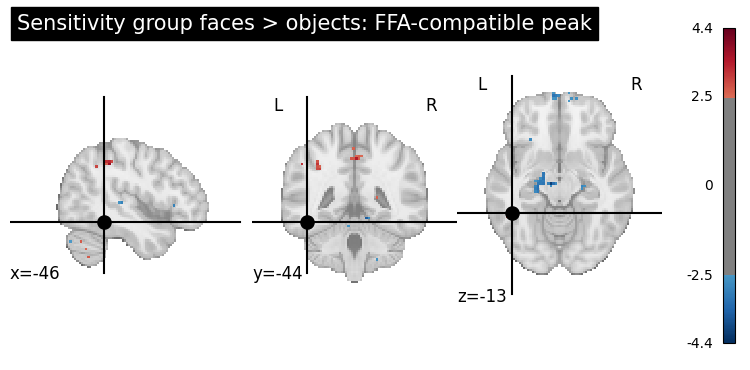

Our peak, MNI: [-46.  -44.5 -13. ]
Our peak, approximate Talairach: [-43.5425  -41.8698  -12.13715]
Closest Kanwisher coordinate, Talairach: [-37. -42. -12.]
Distance after MNI-to-Talairach conversion: ~6.5 mm


In [90]:
# --------------------------------------------------
# Plot closest Kanwisher-compatible group peak on the sensitivity map
# --------------------------------------------------

# Closest FFA-compatible peak from our sensitivity group analysis
# IMPORTANT: use MNI coordinates for plotting on our MNI brain map.
our_group_ffa_like_peak_mni = np.array([[-46.0, -44.5, -13.0]])

# Its approximate Talairach conversion, for reporting only
our_group_ffa_like_peak_tal = np.array([[-43.5425, -41.8698, -12.13715]])

# Closest Kanwisher Table 1 coordinate in Talairach space
kanwisher_closest_tal = np.array([[-37.0, -42.0, -12.0]])

plot_display = plotting.plot_stat_map(
    sensitivity_group_z_maps["faces_gt_objects"],
    threshold=2.5,
    display_mode="ortho",
    cut_coords=(-46.0, -44.5, -13.0),
    title="Sensitivity group faces > objects: FFA-compatible peak",
    colorbar=True,
)

plot_display.add_markers(
    marker_coords=our_group_ffa_like_peak_mni,
    marker_color="black",
    marker_size=90,
)

plt.show()

print("Our peak, MNI:", our_group_ffa_like_peak_mni[0])
print("Our peak, approximate Talairach:", our_group_ffa_like_peak_tal[0])
print("Closest Kanwisher coordinate, Talairach:", kanwisher_closest_tal[0])
print("Distance after MNI-to-Talairach conversion: ~6.5 mm")

Sagittal | Coronal | Axial

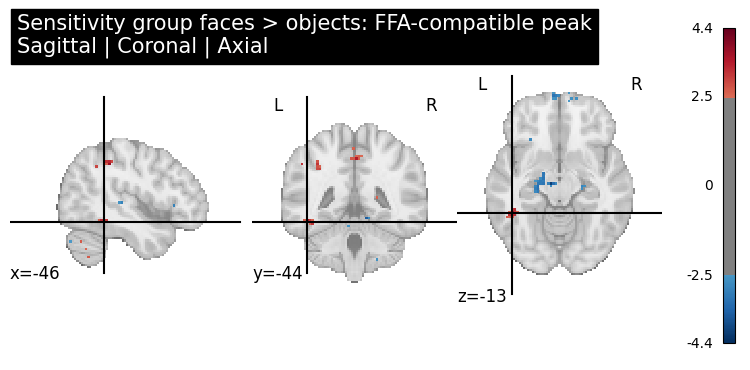

In [93]:
# --------------------------------------------------
# Clean orthogonal plot without black marker
# Sagittal | Coronal | Axial
# --------------------------------------------------

ffa_like_peak_mni = (-46.0, -44.5, -13.0)

plot_display = plotting.plot_stat_map(
    sensitivity_group_z_maps["faces_gt_objects"],
    threshold=2.5,
    display_mode="ortho",
    cut_coords=ffa_like_peak_mni,
    title=(
        "Sensitivity group faces > objects: FFA-compatible peak\n"
        "Sagittal | Coronal | Axial"
    ),
    colorbar=True,
    draw_cross=True,
)

plt.show()

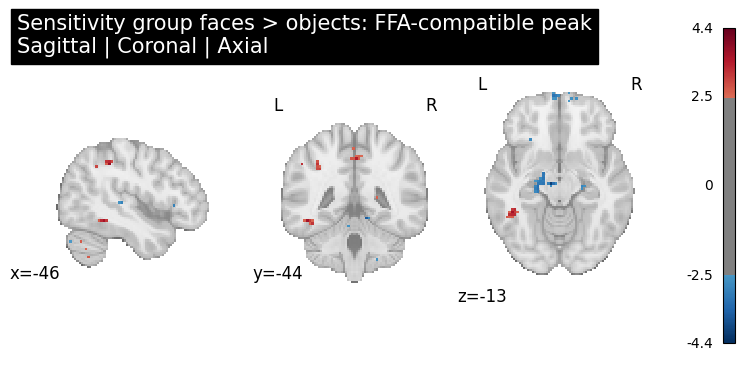

In [94]:
# --------------------------------------------------
# Clean orthogonal plot without marker and without crosshair
# Sagittal | Coronal | Axial
# --------------------------------------------------

ffa_like_peak_mni = (-46.0, -44.5, -13.0)

plot_display = plotting.plot_stat_map(
    sensitivity_group_z_maps["faces_gt_objects"],
    threshold=2.5,
    display_mode="ortho",
    cut_coords=ffa_like_peak_mni,
    title=(
        "Sensitivity group faces > objects: FFA-compatible peak\n"
        "Sagittal | Coronal | Axial"
    ),
    colorbar=True,
    draw_cross=False,
)

plt.show()

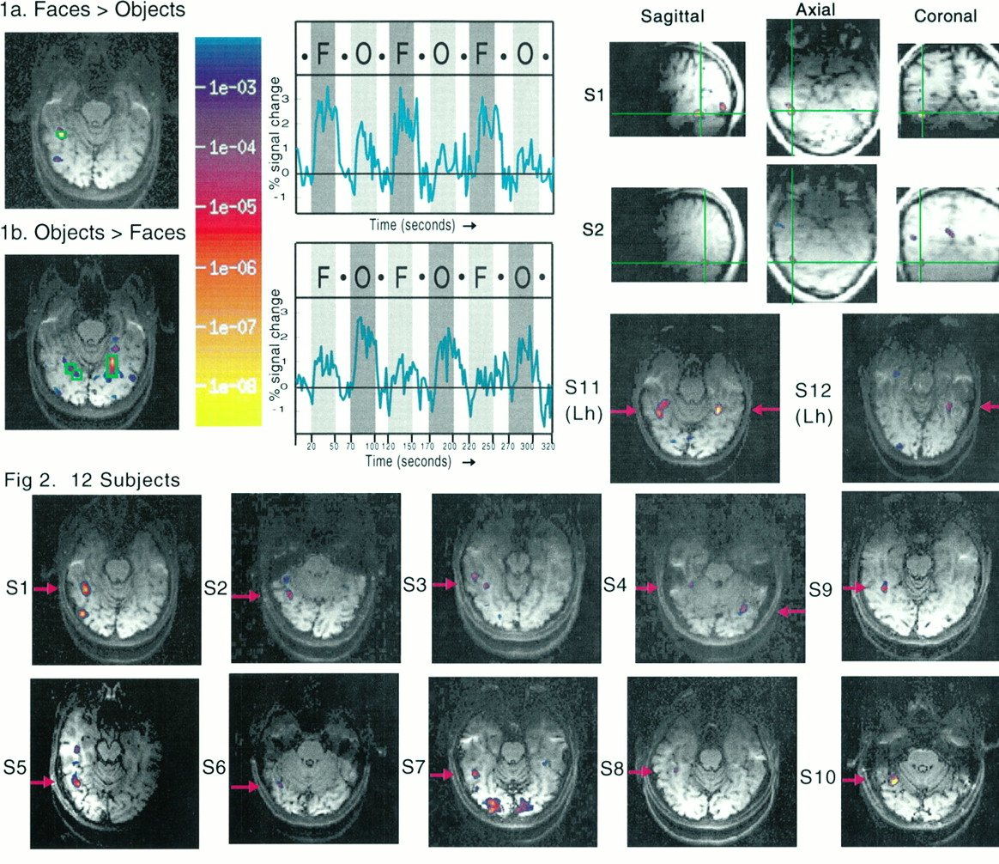

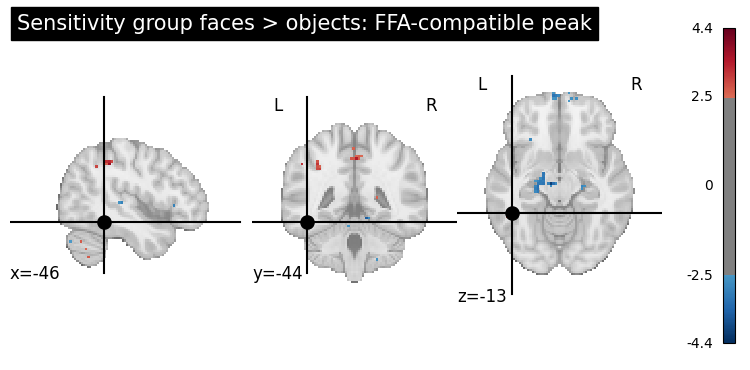

In [91]:
# --------------------------------------------------
# Three-plane view of FFA-compatible sensitivity group peak
# Equivalent logic to Kanwisher sagittal / axial / coronal display
# --------------------------------------------------

ffa_like_peak_mni = np.array([[-46.0, -44.5, -13.0]])

plot_display = plotting.plot_stat_map(
    sensitivity_group_z_maps["faces_gt_objects"],
    threshold=2.5,
    display_mode="ortho",
    cut_coords=(-46.0, -44.5, -13.0),
    title="Sensitivity group faces > objects: FFA-compatible peak",
    colorbar=True,
    draw_cross=True,
)

plot_display.add_markers(
    marker_coords=ffa_like_peak_mni,
    marker_color="black",
    marker_size=90,
)

plt.show()

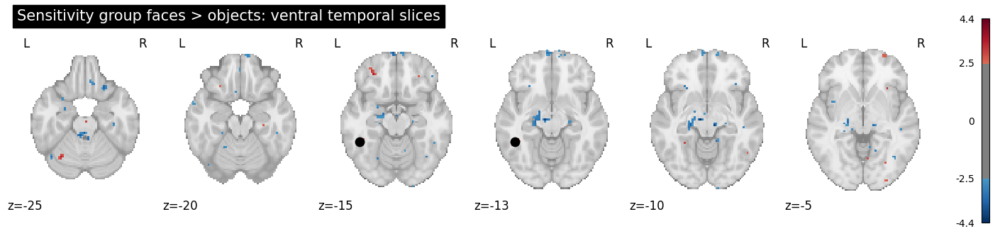

In [92]:
# --------------------------------------------------
# Axial slice through the FFA-compatible peak
# --------------------------------------------------

plot_display = plotting.plot_stat_map(
    sensitivity_group_z_maps["faces_gt_objects"],
    threshold=2.5,
    display_mode="z",
    cut_coords=[-25, -20, -15, -13, -10, -5],
    title="Sensitivity group faces > objects: ventral temporal slices",
    colorbar=True,
)

plot_display.add_markers(
    marker_coords=our_group_ffa_like_peak_mni,
    marker_color="black",
    marker_size=80,
)

plt.show()

In [95]:
# --------------------------------------------------
# Full 32-subject faces > objects peaks:
# compare to Kanwisher Table 1 FFA coordinates
# --------------------------------------------------

full_faces_table = cluster_tables["faces_gt_objects"].copy()

full_match_rows_tal = []

for _, peak_row in full_faces_table.iterrows():
    peak_mni = np.array([
        peak_row["X"],
        peak_row["Y"],
        peak_row["Z"],
    ], dtype=float)
    
    peak_tal = mni_to_tal(peak_mni)
    
    for _, ref_row in kanwisher_ffa_coords.iterrows():
        ref_coord = np.array([
            ref_row["x"],
            ref_row["y"],
            ref_row["z"],
        ], dtype=float)
        
        distance = np.linalg.norm(peak_tal - ref_coord)
        
        full_match_rows_tal.append({
            "cluster_id": peak_row["Cluster ID"],
            "peak_mni_x": peak_row["X"],
            "peak_mni_y": peak_row["Y"],
            "peak_mni_z": peak_row["Z"],
            "peak_tal_x": peak_tal[0],
            "peak_tal_y": peak_tal[1],
            "peak_tal_z": peak_tal[2],
            "peak_stat": peak_row["Peak Stat"],
            "kanwisher_subject": ref_row["subject"],
            "kanwisher_x": ref_row["x"],
            "kanwisher_y": ref_row["y"],
            "kanwisher_z": ref_row["z"],
            "distance_mm_after_mni_to_tal": distance,
        })

full_kanwisher_match_tal_df = pd.DataFrame(full_match_rows_tal)

ipy_display(
    full_kanwisher_match_tal_df
    .sort_values("distance_mm_after_mni_to_tal")
    .head(20)
)

,cluster_id,peak_mni_x,peak_mni_y,peak_mni_z,peak_tal_x,peak_tal_y,peak_tal_z,peak_stat,kanwisher_subject,kanwisher_x,kanwisher_y,kanwisher_z,distance_mm_after_mni_to_tal
3,1.0,11.5,-64.5,37.0,9.03,-65.1328,31.59085,3.199059,S4_R,31,-62,-6,43.652804
6,1.0,11.5,-64.5,37.0,9.03,-65.1328,31.59085,3.199059,S6_R,37,-69,-3,44.652022
1,1.0,11.5,-64.5,37.0,9.03,-65.1328,31.59085,3.199059,S2,37,-57,-9,49.960789
13,1.0,11.5,-64.5,37.0,9.03,-65.1328,31.59085,3.199059,S10_R,34,-57,-15,53.482246
7,1.0,11.5,-64.5,37.0,9.03,-65.1328,31.59085,3.199059,S6_L,-34,-69,0,53.521191
10,1.0,11.5,-64.5,37.0,9.03,-65.1328,31.59085,3.199059,S8_R,40,-39,-6,55.273286
12,1.0,11.5,-64.5,37.0,9.03,-65.1328,31.59085,3.199059,S9,40,-51,-12,55.308581
11,1.0,11.5,-64.5,37.0,9.03,-65.1328,31.59085,3.199059,S8_L,-34,-75,-3,56.084485
0,1.0,11.5,-64.5,37.0,9.03,-65.1328,31.59085,3.199059,S1,40,-48,-12,56.150120
16,1.0,11.5,-64.5,37.0,9.03,-65.1328,31.59085,3.199059,S11_R,40,-48,-12,56.150120


In [96]:
# --------------------------------------------------
# Flag full-group peaks close to Kanwisher FFA coordinates
# --------------------------------------------------

near_ffa_full_tal = full_kanwisher_match_tal_df.copy()

near_ffa_full_tal["within_15mm"] = (
    near_ffa_full_tal["distance_mm_after_mni_to_tal"] <= 15
)

near_ffa_full_tal["within_20mm"] = (
    near_ffa_full_tal["distance_mm_after_mni_to_tal"] <= 20
)

ipy_display(
    near_ffa_full_tal
    .query("within_20mm")
    .sort_values("distance_mm_after_mni_to_tal")
)

,cluster_id,peak_mni_x,peak_mni_y,peak_mni_z,peak_tal_x,peak_tal_y,peak_tal_z,peak_stat,kanwisher_subject,kanwisher_x,kanwisher_y,kanwisher_z,distance_mm_after_mni_to_tal,within_15mm,within_20mm


In [97]:
# --------------------------------------------------
# Sample full-group z-values around Kanwisher FFA coordinates
# using 6 mm spheres
# --------------------------------------------------

from nilearn.maskers import NiftiSpheresMasker

full_faces_z = group_z_maps["faces_gt_objects"]

sphere_rows = []

for _, ref_row in kanwisher_ffa_coords.iterrows():
    # Kanwisher coordinates are Talairach.
    # For this quick check, we use them approximately as MNI-like coordinates.
    # This is conservative/approximate; the previous cell is better for coordinate matching.
    coord = [ref_row["x"], ref_row["y"], ref_row["z"]]
    
    masker = NiftiSpheresMasker(
        seeds=[coord],
        radius=6,
        standardize=False,
    )
    
    try:
        value = masker.fit_transform(full_faces_z).ravel()[0]
    except Exception:
        value = np.nan
    
    sphere_rows.append({
        "kanwisher_subject": ref_row["subject"],
        "coord_x": ref_row["x"],
        "coord_y": ref_row["y"],
        "coord_z": ref_row["z"],
        "mean_z_in_6mm_sphere_full_group": value,
    })

full_group_kanwisher_sphere_df = pd.DataFrame(sphere_rows)

ipy_display(
    full_group_kanwisher_sphere_df
    .sort_values("mean_z_in_6mm_sphere_full_group", ascending=False)
)

,kanwisher_subject,coord_x,coord_y,coord_z,mean_z_in_6mm_sphere_full_group
17,S12,-34,-48,-6,0.501855
15,S11_L,-37,-42,-12,0.141161
14,S10_L,-37,-41,-12,0.077992
0,S1,40,-48,-12,0.072093
16,S11_R,40,-48,-12,0.072093
2,S3,43,-54,-18,0.035477
10,S8_R,40,-39,-6,0.026317
11,S8_L,-34,-75,-3,0.012444
7,S6_L,-34,-69,0,-0.014920
3,S4_R,31,-62,-6,-0.029774


In [98]:
# --------------------------------------------------
# Sensitivity group faces > objects peaks:
# compare to Kanwisher Table 1 FFA coordinates
# --------------------------------------------------

sensitivity_faces_table = sensitivity_cluster_tables["faces_gt_objects"].copy()

sensitivity_match_rows_tal = []

for _, peak_row in sensitivity_faces_table.iterrows():
    peak_mni = np.array([
        peak_row["X"],
        peak_row["Y"],
        peak_row["Z"],
    ], dtype=float)
    
    peak_tal = mni_to_tal(peak_mni)
    
    for _, ref_row in kanwisher_ffa_coords.iterrows():
        ref_coord = np.array([
            ref_row["x"],
            ref_row["y"],
            ref_row["z"],
        ], dtype=float)
        
        distance = np.linalg.norm(peak_tal - ref_coord)
        
        sensitivity_match_rows_tal.append({
            "cluster_id": peak_row["Cluster ID"],
            "peak_mni_x": peak_row["X"],
            "peak_mni_y": peak_row["Y"],
            "peak_mni_z": peak_row["Z"],
            "peak_tal_x": peak_tal[0],
            "peak_tal_y": peak_tal[1],
            "peak_tal_z": peak_tal[2],
            "peak_stat": peak_row["Peak Stat"],
            "kanwisher_subject": ref_row["subject"],
            "kanwisher_x": ref_row["x"],
            "kanwisher_y": ref_row["y"],
            "kanwisher_z": ref_row["z"],
            "distance_mm_after_mni_to_tal": distance,
        })

sensitivity_kanwisher_match_tal_df = pd.DataFrame(sensitivity_match_rows_tal)

ipy_display(
    sensitivity_kanwisher_match_tal_df
    .sort_values("distance_mm_after_mni_to_tal")
    .head(20)
)

,cluster_id,peak_mni_x,peak_mni_y,peak_mni_z,peak_tal_x,peak_tal_y,peak_tal_z,peak_stat,kanwisher_subject,kanwisher_x,kanwisher_y,kanwisher_z,distance_mm_after_mni_to_tal
87,3,-46.0,-44.5,-13.0,-43.5425,-41.86980,-12.13715,3.626184,S11_L,-37,-42,-12,6.545232
86,3,-46.0,-44.5,-13.0,-43.5425,-41.86980,-12.13715,3.626184,S10_L,-37,-41,-12,6.601490
119,5,-33.5,-87.0,4.5,-32.2835,-83.04705,-0.08290,3.608372,S8_L,-34,-75,-3,8.729883
89,3,-46.0,-44.5,-13.0,-43.5425,-41.86980,-12.13715,3.626184,S12,-34,-48,-6,12.895862
115,5,-33.5,-87.0,4.5,-32.2835,-83.04705,-0.08290,3.608372,S6_L,-34,-69,0,14.151779
117,5,-33.5,-87.0,4.5,-32.2835,-83.04705,-0.08290,3.608372,S7_L,-40,-69,-12,19.972012
76,3,-46.0,-44.5,-13.0,-43.5425,-41.86980,-12.13715,3.626184,S4_L,-31,-62,-15,23.890064
112,5,-33.5,-87.0,4.5,-32.2835,-83.04705,-0.08290,3.608372,S4_L,-31,-62,-15,25.829161
81,3,-46.0,-44.5,-13.0,-43.5425,-41.86980,-12.13715,3.626184,S7_L,-40,-69,-12,27.360846
79,3,-46.0,-44.5,-13.0,-43.5425,-41.86980,-12.13715,3.626184,S6_L,-34,-69,0,31.215661


In [99]:
# --------------------------------------------------
# Flag sensitivity-group peaks close to Kanwisher FFA coordinates
# --------------------------------------------------

near_ffa_sensitivity_tal = sensitivity_kanwisher_match_tal_df.copy()

near_ffa_sensitivity_tal["within_15mm"] = (
    near_ffa_sensitivity_tal["distance_mm_after_mni_to_tal"] <= 15
)

near_ffa_sensitivity_tal["within_20mm"] = (
    near_ffa_sensitivity_tal["distance_mm_after_mni_to_tal"] <= 20
)

ipy_display(
    near_ffa_sensitivity_tal
    .query("within_20mm")
    .sort_values("distance_mm_after_mni_to_tal")
)

,cluster_id,peak_mni_x,peak_mni_y,peak_mni_z,peak_tal_x,peak_tal_y,peak_tal_z,peak_stat,kanwisher_subject,kanwisher_x,kanwisher_y,kanwisher_z,distance_mm_after_mni_to_tal,within_15mm,within_20mm
87,3,-46.0,-44.5,-13.0,-43.5425,-41.86980,-12.13715,3.626184,S11_L,-37,-42,-12,6.545232,True,True
86,3,-46.0,-44.5,-13.0,-43.5425,-41.86980,-12.13715,3.626184,S10_L,-37,-41,-12,6.601490,True,True
119,5,-33.5,-87.0,4.5,-32.2835,-83.04705,-0.08290,3.608372,S8_L,-34,-75,-3,8.729883,True,True
89,3,-46.0,-44.5,-13.0,-43.5425,-41.86980,-12.13715,3.626184,S12,-34,-48,-6,12.895862,True,True
115,5,-33.5,-87.0,4.5,-32.2835,-83.04705,-0.08290,3.608372,S6_L,-34,-69,0,14.151779,True,True
117,5,-33.5,-87.0,4.5,-32.2835,-83.04705,-0.08290,3.608372,S7_L,-40,-69,-12,19.972012,False,True


In [100]:
# --------------------------------------------------
# Sample sensitivity-group z-values around Kanwisher FFA coordinates
# using 6 mm spheres in MNI space
# --------------------------------------------------

from nilearn.maskers import NiftiSpheresMasker

sensitivity_faces_z = sensitivity_group_z_maps["faces_gt_objects"]

# Convert Kanwisher Talairach coordinates to approximate MNI first
TAL_TO_MNI = np.linalg.inv(MNI_TO_TAL)

def tal_to_mni(coord):
    coord_h = np.array([coord[0], coord[1], coord[2], 1.0])
    mni_h = TAL_TO_MNI @ coord_h
    return mni_h[:3]


kanwisher_ffa_coords_mni = kanwisher_ffa_coords.copy()

mni_coords_from_tal = np.vstack([
    tal_to_mni(row[["x", "y", "z"]].values.astype(float))
    for _, row in kanwisher_ffa_coords.iterrows()
])

kanwisher_ffa_coords_mni["mni_x"] = mni_coords_from_tal[:, 0]
kanwisher_ffa_coords_mni["mni_y"] = mni_coords_from_tal[:, 1]
kanwisher_ffa_coords_mni["mni_z"] = mni_coords_from_tal[:, 2]

sensitivity_sphere_rows_mni = []

for _, ref_row in kanwisher_ffa_coords_mni.iterrows():
    coord_mni = [
        ref_row["mni_x"],
        ref_row["mni_y"],
        ref_row["mni_z"],
    ]
    
    masker = NiftiSpheresMasker(
        seeds=[coord_mni],
        radius=6,
        standardize=False,
    )
    
    try:
        value = masker.fit_transform(sensitivity_faces_z).ravel()[0]
    except Exception:
        value = np.nan
    
    sensitivity_sphere_rows_mni.append({
        "kanwisher_subject": ref_row["subject"],
        "tal_x": ref_row["x"],
        "tal_y": ref_row["y"],
        "tal_z": ref_row["z"],
        "approx_mni_x": ref_row["mni_x"],
        "approx_mni_y": ref_row["mni_y"],
        "approx_mni_z": ref_row["mni_z"],
        "mean_z_in_6mm_sphere_sensitivity_group": value,
    })

sensitivity_group_kanwisher_sphere_mni_df = pd.DataFrame(
    sensitivity_sphere_rows_mni
)

ipy_display(
    sensitivity_group_kanwisher_sphere_mni_df
    .sort_values("mean_z_in_6mm_sphere_sensitivity_group", ascending=False)
)

,kanwisher_subject,tal_x,tal_y,tal_z,approx_mni_x,approx_mni_y,approx_mni_z,mean_z_in_6mm_sphere_sensitivity_group
15,S11_L,-37,-42,-12,-38.929277,-44.599301,-12.956921,1.065055
14,S10_L,-37,-41,-12,-38.933377,-43.535732,-13.062088,1.047783
9,S7_L,-40,-69,-12,-42.059689,-73.327079,-10.061084,0.396718
11,S8_L,-34,-75,-3,-35.427938,-78.750914,0.447793,0.390085
17,S12,-34,-48,-6,-35.580276,-50.346138,-5.721891,0.293092
6,S6_R,37,-69,-3,41.253342,-72.098937,-1.516489,0.206145
7,S6_L,-34,-69,0,-35.410878,-72.057933,3.146975,0.080545
2,S3,43,-54,-18,47.465759,-57.680398,-19.857575,-0.015571
10,S8_R,40,-39,-6,44.329799,-40.492024,-8.058009,-0.024145
8,S7_R,46,-54,-12,50.790164,-57.045825,-13.253546,-0.037000


In [103]:
# --------------------------------------------------
# Extract subject-level effects around the FFA-compatible group peak
# --------------------------------------------------

from nilearn.maskers import NiftiSpheresMasker
from scipy.stats import ttest_1samp, wilcoxon

ffa_like_peak_mni = [-46.0, -44.5, -13.0]
sphere_radius = 6

ffa_sphere_rows = []

for sub in valid_glm_subjects:
    effect_path = OUT_DIR / sub / f"{sub}_faces_gt_objects_effect.nii.gz"
    effect_img = nib.load(str(effect_path))
    
    masker = NiftiSpheresMasker(
        seeds=[ffa_like_peak_mni],
        radius=sphere_radius,
        standardize=False,
    )
    
    value = masker.fit_transform(effect_img).ravel()[0]
    
    ffa_sphere_rows.append({
        "sub": sub,
        "included_in_sensitivity": sub in sensitivity_subjects,
        "faces_gt_objects_effect": value,
    })

ffa_sphere_df = pd.DataFrame(ffa_sphere_rows)

ipy_display(
    ffa_sphere_df
    .sort_values("faces_gt_objects_effect", ascending=False)
)

,sub,included_in_sensitivity,faces_gt_objects_effect
22,sub-P41,True,0.136438
9,sub-P20,True,0.124127
7,sub-P18,True,0.104069
11,sub-P22,True,0.093984
26,sub-P45,True,0.091567
30,sub-P50,True,0.089387
4,sub-P15,True,0.088165
0,sub-P10,True,0.062266
27,sub-P47,True,0.053525
1,sub-P12,True,0.051582


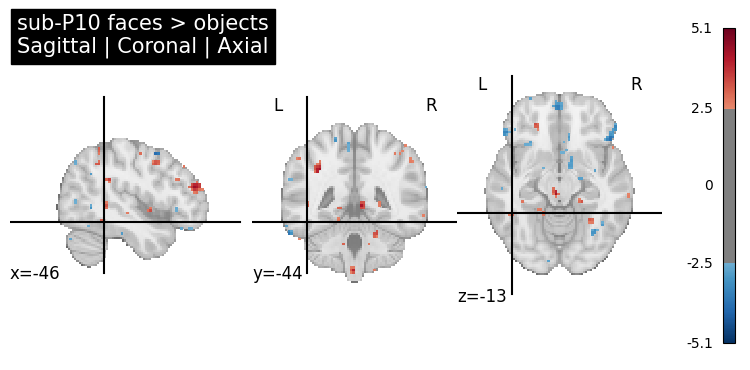

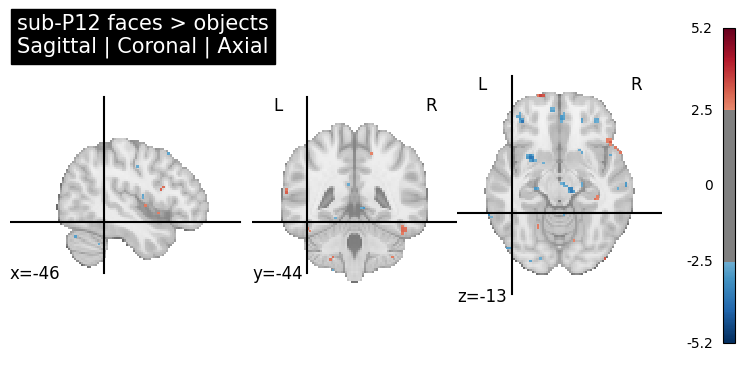

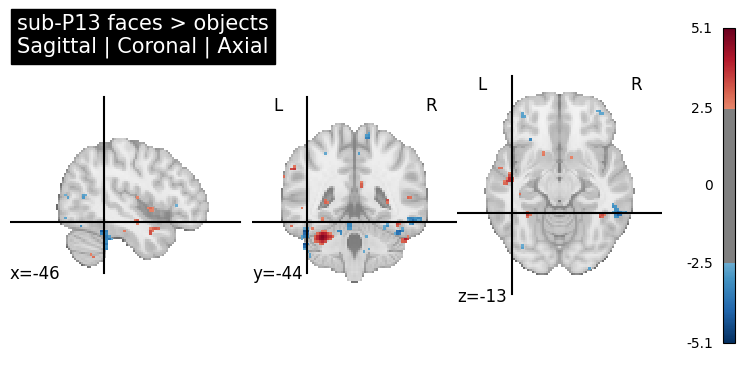

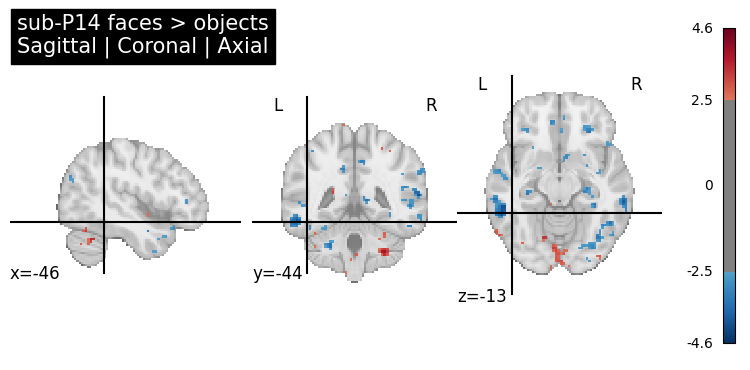

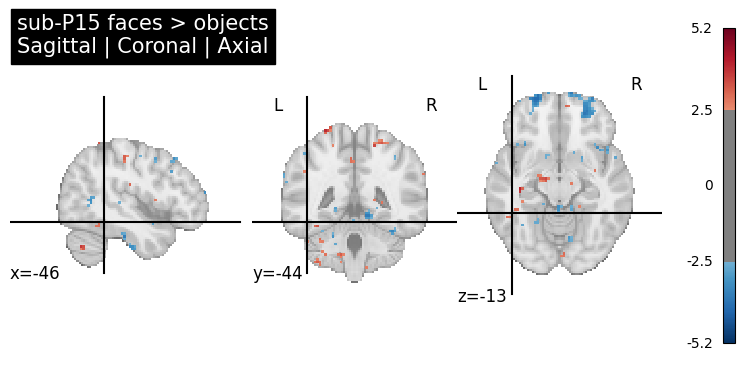

...

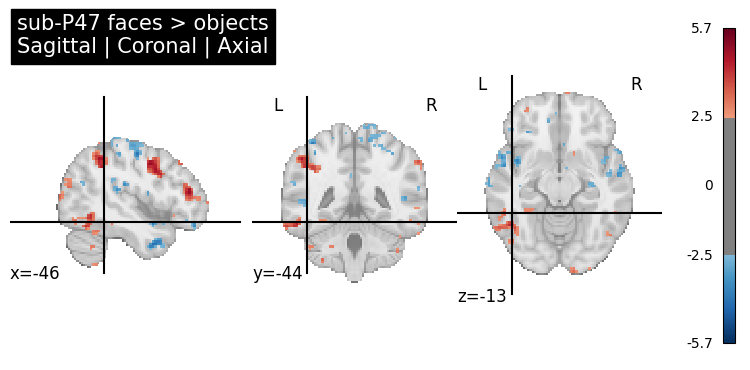

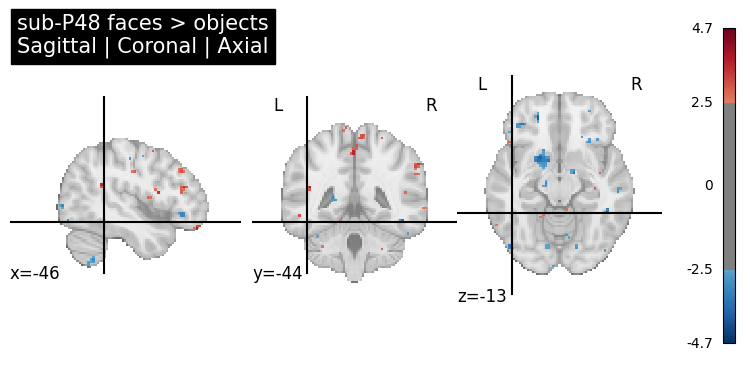

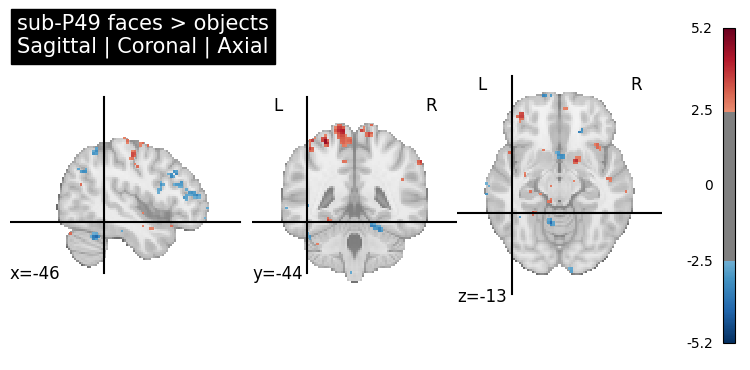

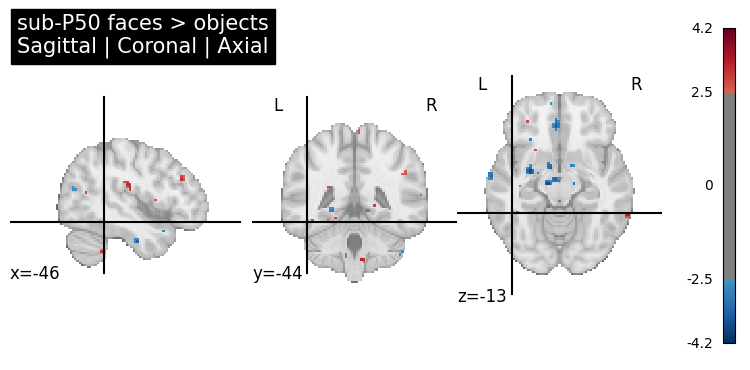

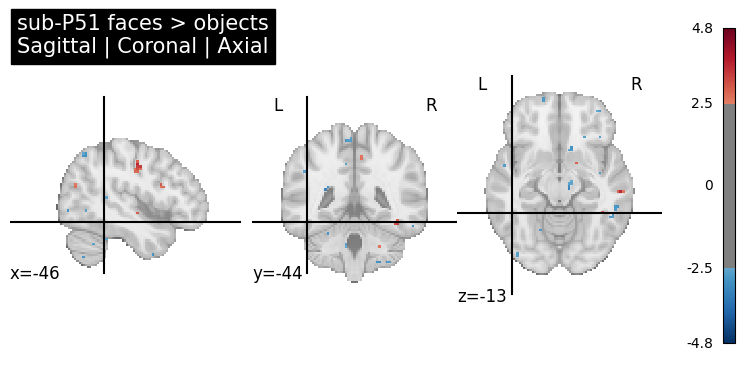

In [105]:
# --------------------------------------------------
# Plot one clean orthogonal faces > objects map per subject
# Sensitivity group only
# Sagittal | Coronal | Axial
# --------------------------------------------------

ffa_like_peak_mni = (-46.0, -44.5, -13.0)

for sub in sensitivity_subjects:
    z_path = OUT_DIR / sub / f"{sub}_faces_gt_objects_z.nii.gz"
    z_img = nib.load(str(z_path))
    
    plotting.plot_stat_map(
        z_img,
        threshold=2.5,
        display_mode="ortho",
        cut_coords=ffa_like_peak_mni,
        title=(
            f"{sub} faces > objects\n"
            "Sagittal | Coronal | Axial"
        ),
        colorbar=True,
        draw_cross=True,
    )
    
    plt.show()

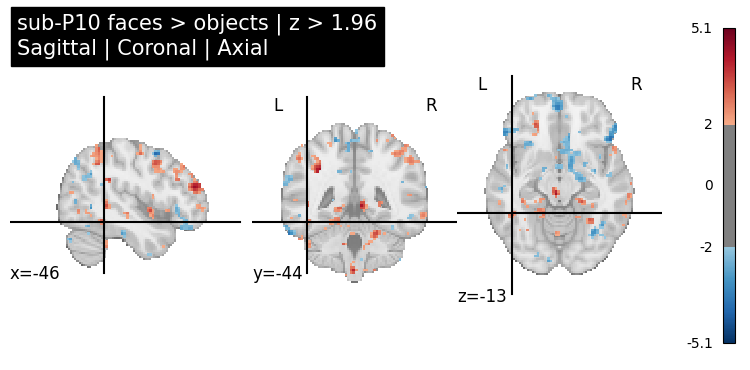

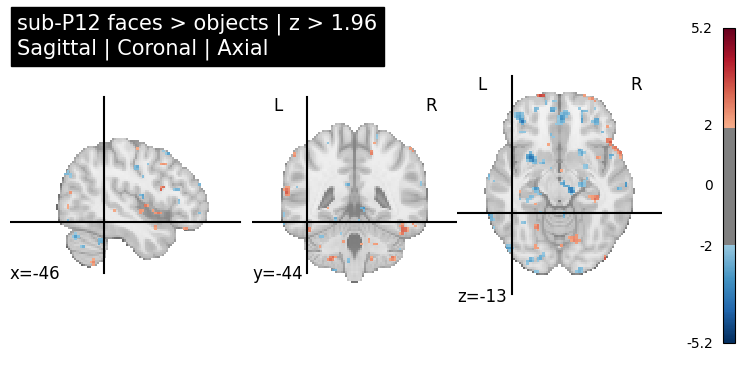

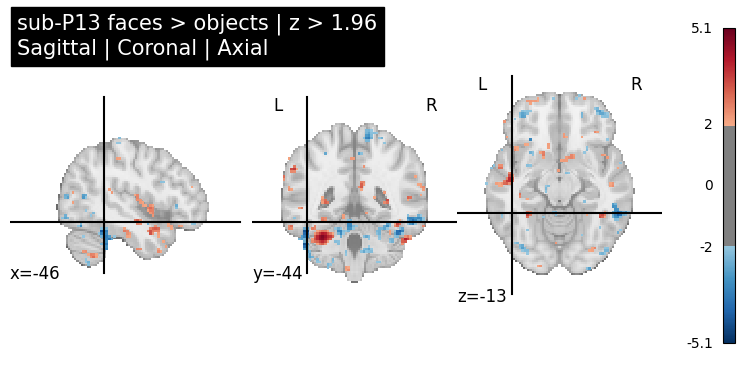

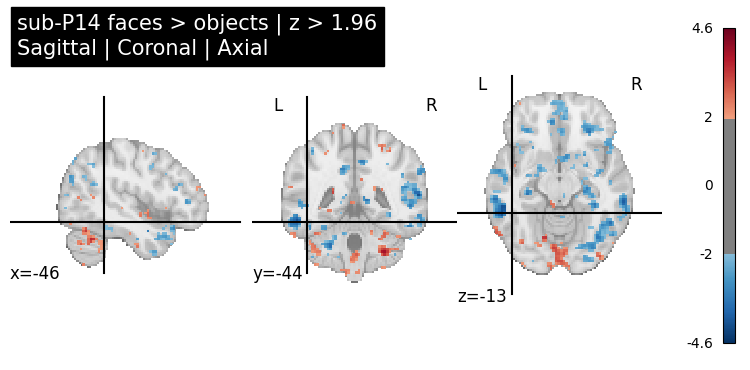

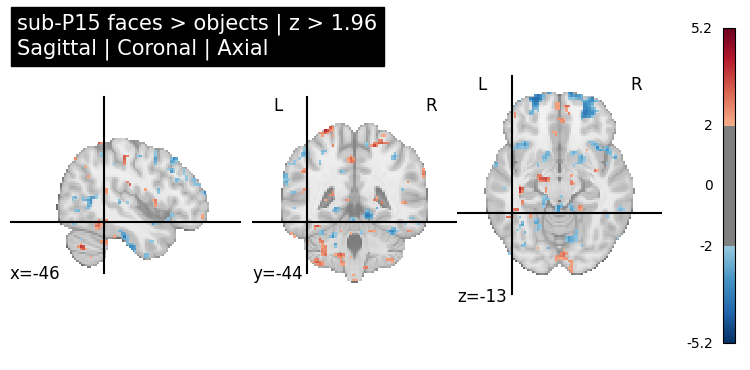

...

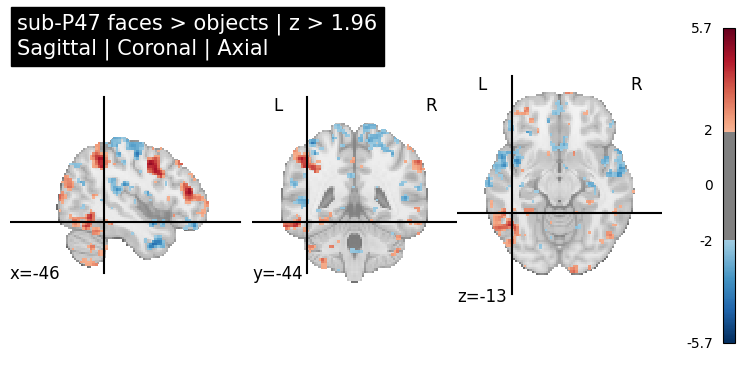

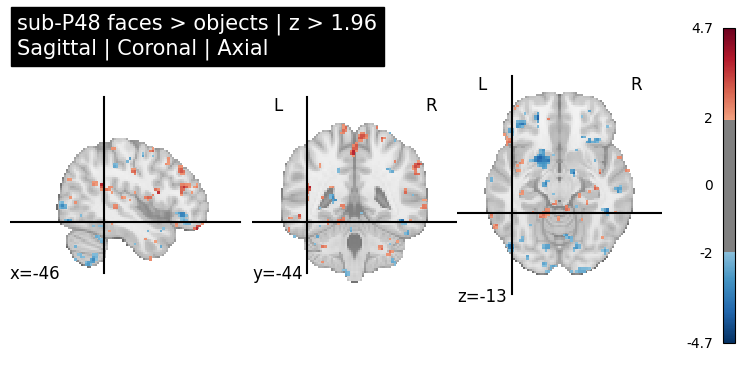

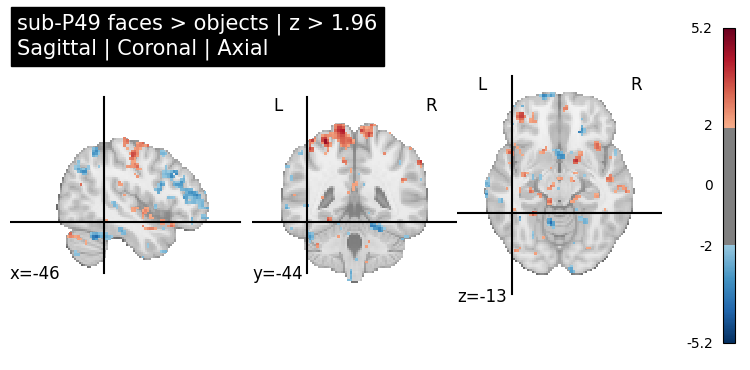

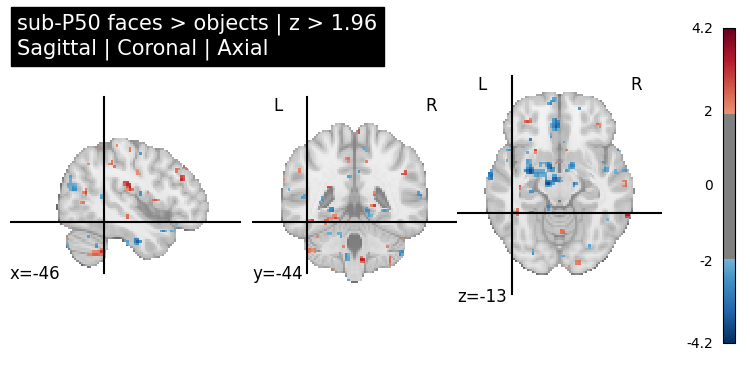

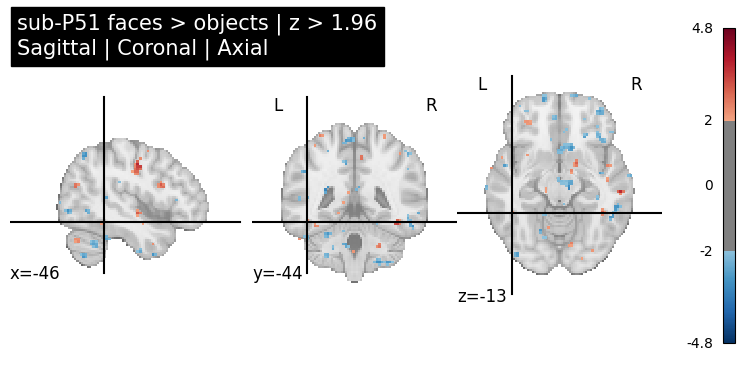

In [106]:
# --------------------------------------------------
# Same plots with z > 1.96 for subject-level inspection
# --------------------------------------------------

ffa_like_peak_mni = (-46.0, -44.5, -13.0)

for sub in sensitivity_subjects:
    z_path = OUT_DIR / sub / f"{sub}_faces_gt_objects_z.nii.gz"
    z_img = nib.load(str(z_path))
    
    plotting.plot_stat_map(
        z_img,
        threshold=1.96,
        display_mode="ortho",
        cut_coords=ffa_like_peak_mni,
        title=(
            f"{sub} faces > objects | z > 1.96\n"
            "Sagittal | Coronal | Axial"
        ),
        colorbar=True,
        draw_cross=True,
    )
    
    plt.show()